In [1]:
import tensorflow as tf
import os
import numpy as np
import matplotlib.pyplot as plt
import time
import cv2
from tensorflow.keras import layers
from keras.models import Model, Sequential
from tensorflow.keras.applications import VGG19
from keras.layers import Dense, Conv2D, Flatten, BatchNormalization, LeakyReLU
from keras.layers import Conv2DTranspose, Dropout, ReLU, Input, Concatenate, ZeroPadding2D
from keras.optimizers import Adam
from keras.utils import plot_model
# from tensorflow.keras.preprocessing.image import ImageDataGenerator
import tensorflow_addons as tfa

/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.24.3
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"
/opt/conda/lib/python3.10/site-packages/tensorflow_addons/utils/tfa_eol_msg.py:23: UserWarning: 

TensorFlow Addons (TFA) has ended development and introduction of new features.
TFA has entered a minimal maintenance and release mode until a planned end of life in May 2024.
Please modify downstream libraries to take dependencies from other repositories in our TensorFlow community (e.g. Keras, Keras-CV, and Keras-NLP). 

For more information see: https://github.com/tensorflow/addons/issues/2807 

  warnings.warn(


In [2]:
import tensorflow as tf

physical_devices = tf.config.list_physical_devices('GPU')
if len(physical_devices) == 0:
    print("No GPU devices found. Make sure your GPU is properly installed and configured.")
else:
    tf.config.experimental.set_memory_growth(physical_devices[0], True)
    print("GPU configured successfully.")

GPU configured successfully.


In [3]:
import tensorflow as tf

# Check available GPUs
gpus = tf.config.experimental.list_physical_devices('GPU')
if gpus:
    # Restrict TensorFlow to only allocate GPU memory growth
    try:
        tf.config.experimental.set_memory_growth(gpus[0], True)
        print("GPU memory growth set to True")
    except RuntimeError as e:
        print(e)

GPU memory growth set to True


In [4]:
import tensorflow as tf

# Check if TensorFlow can access GPU
num_gpus = len(tf.config.experimental.list_physical_devices('GPU'))

if num_gpus > 0:
    print("Num GPUs Available: ", num_gpus)
    print("TensorFlow is using GPU.")
else:
    print("No GPU available. TensorFlow is using CPU.")

Num GPUs Available:  1
TensorFlow is using GPU.


In [5]:
def load(image_file):
    image = tf.io.read_file(image_file)
    image = tf.image.decode_jpeg(image, channels=3)
    image = tf.cast(image,tf.float32)
    return image

In [6]:
path = "/kaggle/input/coco2017/"
x = load(os.path.join(path, 'train2017/train2017/000000000072.jpg'))
print(x.shape)

(640, 427, 3)


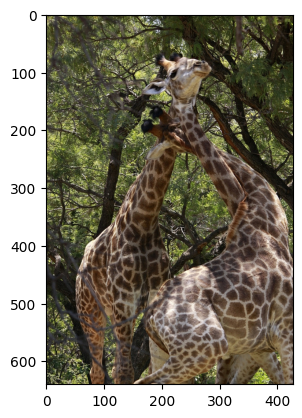

In [7]:
plt.imshow(x/255.0)

In [8]:
def normalize(real_image):
    real_image = (real_image / 255)
    return real_image

In [9]:
def random_crop(real_image):
    cropped_image = tf.image.random_crop(real_image, size = [256, 256, 3])
    return cropped_image

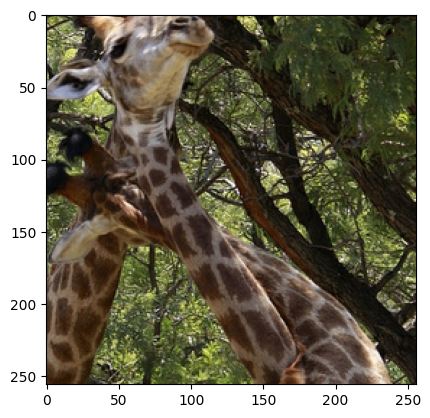

In [10]:
x_aug = random_crop(x)
plt.imshow(x_aug/255.0)

In [11]:
def resize(real_image):
    real_image = tf.image.resize(real_image, [256, 256], method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)
    return real_image

In [12]:
def rotate_image(image, angles, interpolation='BILINEAR'):
    """
    Rotate an image tensor by specified angles.

    Args:
    - image: Input image tensor with shape (batch_size, height, width, channels).
    - angles: Tensor of rotation angles in radians for each image in the batch.
    - interpolation: Interpolation method ('BILINEAR' or 'NEAREST').

    Returns:
    - Rotated image tensor.
    """
    batch_size, height, width, channels = tf.unstack(tf.shape(image))

    # Coordinates of the center of the image
    center_x = tf.cast(width, tf.float32) / 2.0
    center_y = tf.cast(height, tf.float32) / 2.0

    # Define transformation matrix
    rotation_matrix = tf.reshape(tf.stack([tf.cos(angles), -tf.sin(angles), center_x * (1 - tf.cos(angles)) + center_y * tf.sin(angles),
                                           tf.sin(angles), tf.cos(angles), -center_x * tf.sin(angles) + center_y * (1 - tf.cos(angles)),
                                           0.0, 0.0, 1.0], axis=1), shape=(-1, 3, 3))

    # Apply rotation to each pixel
    rotated_image = tfa.image.transform(image, rotation_matrix, interpolation)

    return rotated_image


In [13]:
def random_jitter(real_image):
    if tf.random.uniform(()) > 0.5:
        real_image = tf.image.flip_left_right(real_image)
    return real_image

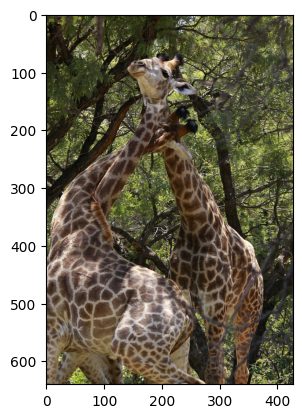

In [14]:
x_jitter = random_jitter(x)
plt.imshow(x_jitter/255.0)

In [15]:
def resize_with_aspect_ratio(image, constant_size):
        # Get image dimensions
        height, width = tf.shape(image)[0], tf.shape(image)[1]

        # Calculate aspect ratio
        aspect_ratio = tf.cast(width, tf.float32) / tf.cast(height, tf.float32)

        # Determine new dimensions based on constant size
        new_height = tf.cond(aspect_ratio >= 1.0,
                             lambda: constant_size,
                             lambda: tf.cast(constant_size / aspect_ratio, tf.int32))
        new_width = tf.cond(aspect_ratio >= 1.0,
                            lambda: tf.cast(constant_size * aspect_ratio, tf.int32),
                            lambda: constant_size)

        # Resize the image
        resized_image = tf.image.resize(image, [new_height, new_width])

        return resized_image

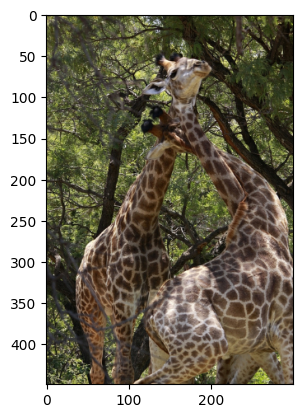

In [16]:
plt.imshow(resize_with_aspect_ratio(x,300)/255)

In [17]:
def load_train_images(image_path):
    real_image = load(image_path)
    real_image = resize_with_aspect_ratio(real_image, 300)
#     real_image = tf.image.resize(real_image, [256, 256], method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)
    real_image = tf.image.random_brightness(real_image, 0.2)
    real_image = random_crop(real_image)
    # Define the rotation angle in radians
    rotation_angle = tf.constant(20.0 * (3.141592653589793 / 180.0), dtype=tf.float32)

    # Apply the rotation using tfa.image.rotate
    real_image = tfa.image.rotate(real_image, angles=rotation_angle)

#     # Example usage
#     angles = tf.placeholder(dtype=tf.float32, shape=(None,))
#     # Specify the rotation range in degrees
#     rotation_range = 15  # Adjust this value as needed
#     # Convert the rotation range to radians
#     rotation_range_rad = rotation_range * (np.pi / 180.0)
#     # Generate random rotation angles for each image in the batch
#     random_angles = tf.random.uniform(shape=(tf.shape(image)[0],), minval=-rotation_range_rad, maxval=rotation_range_rad)
#     # Apply custom rotation to the image with bilinear interpolation
#     real_image = rotate_image(real_image, random_angles, interpolation='BILINEAR')
    #     real_image = rotate(real_image)
    real_image = random_jitter(real_image)
    real_image = normalize(real_image)
    yuv_image = tf.image.rgb_to_yuv(real_image)
    # Separate LAB into L and AB components
    Y_channel = tf.expand_dims(yuv_image[:, :, 0], axis=-1)  # L channel
    UV_channels = yuv_image[:, :, 1:]  # AB channels
    #here L_channel becomes input i.e light/luminance of pixel and AB_channels become target
    return Y_channel, UV_channels

In [18]:
def load_test_image(image_path):
    real_image = load(image_path)
    real_image = resize_with_aspect_ratio(real_image, 256)
#     real_image = tf.image.resize(real_image, [256, 256], method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)
#     real_image = tf.image.random_brightness(real_image, 0.2)
    real_image = random_crop(real_image)
    real_image = normalize(real_image)
    yuv_image = tf.image.rgb_to_yuv(real_image)
    # Separate LAB into L and AB components
    Y_channel = tf.expand_dims(yuv_image[:, :, 0], axis=-1)  # L channel
    UV_channels = yuv_image[:, :, 1:]  # AB channels
    #here L_channel becomes input i.e light/luminance of pixel and AB_channels become target
    return Y_channel, UV_channels

In [19]:
IMAGE_SIZE = 256
BATCH_SIZE = 16

In [20]:
# create input pipeline
train_dataset = tf.data.Dataset.list_files(path + "train2017/train2017/*.jpg")
train_dataset = train_dataset.map(load_train_images)
train_dataset = train_dataset.take(8000)
train_dataset = train_dataset.shuffle(10).batch(BATCH_SIZE)
train_dataset.cardinality().numpy()

500

In [21]:
# create input pipeline
val = tf.data.Dataset.list_files(path + "val2017/val2017/*.jpg")
val = val.map(load_test_image)
val = val.take(1000)
val = val.shuffle(10).batch(BATCH_SIZE)
val.cardinality().numpy()

63

In [22]:
# test_dataset = tf.data.Dataset.list_files(path + 'test/*.jpg')
# test_dataset = test_dataset.map(load_test_image)
# test_dataset = test_dataset.batch(1)
# test_dataset

In [23]:
# downsample block
def downsample(filters, size,dropout=False, batchnorm = True):
    init = tf.random_normal_initializer(0.,0.02)
    result = Sequential()
    result.add(Conv2D(filters, size, strides = 2, padding = "same", kernel_initializer = init, use_bias = False))
    if batchnorm == True:
        result.add(BatchNormalization())
    if dropout == True :
        result.add(Dropout(0.3))
    result.add(LeakyReLU())
    return result
down_model = downsample(3,4)
down_result = down_model(tf.expand_dims(x, axis = 0))
print(down_result.shape)

(1, 320, 214, 3)


In [24]:
# upsample block
def upsample(filters, size, dropout = False):
    init = tf.random_normal_initializer(0, 0.02)
    result = Sequential()
    result.add(Conv2DTranspose(filters, size, strides = 2, padding = "same", kernel_initializer = init, use_bias = False))
    result.add(BatchNormalization())
    if dropout == True:
        result.add(Dropout(0.3))
    result.add(ReLU())
    return result
up_model = upsample(3,4)
up_result = up_model(down_result)
print(up_result.shape)

(1, 640, 428, 3)


In [25]:
def generator(input_shape = (256,256,1), output_channels = 2):
    inputs = Input(shape = input_shape)
    down_stack = [
        downsample(32, 4, batchnorm=False),
        downsample(64, 4),
        downsample(128, 4),
        downsample(256, 4, dropout = True),
        downsample(512, 4, dropout = True)
    ]


    up_stack = [
        upsample(512, 4, dropout=True),
        upsample(256, 4, dropout=True),
        upsample(128, 4, dropout=True),
        upsample(64, 4),
        upsample(32, 4),
    ]
    init = tf.random_normal_initializer(0., 0.02)
    last = Conv2DTranspose(2, 4, strides = 2, padding = "same", kernel_initializer = init, activation ="tanh")
    x = inputs
    skips = []
    for down in down_stack:
        x = down(x)
        skips.append(x)
    skips = reversed(skips[:-1])

    for up, skip in zip(up_stack, skips):
        x = up(x)
        x = Concatenate()([x, skip])

    x = last(x)
    return Model(inputs = inputs, outputs = x)

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 256, 256, 1)]        0         []                            
                                                                                                  
 sequential_2 (Sequential)   (None, 128, 128, 32)         512       ['input_1[0][0]']             
                                                                                                  
 sequential_3 (Sequential)   (None, 64, 64, 64)           33024     ['sequential_2[0][0]']        
                                                                                                  
 sequential_4 (Sequential)   (None, 32, 32, 128)          131584    ['sequential_3[0][0]']        
                                                                                              

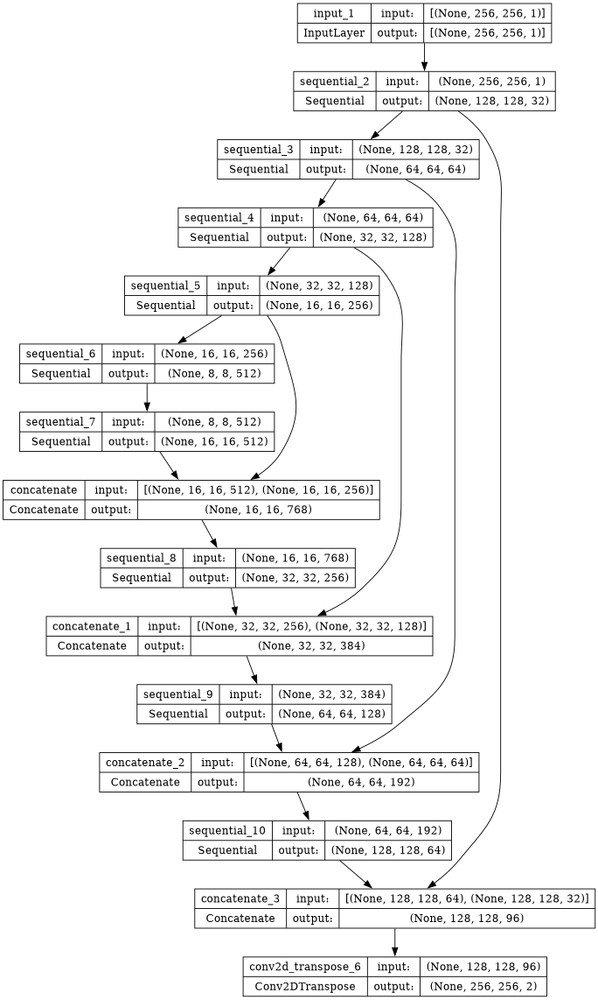

In [26]:
gen = generator()
gen.summary()
plot_model(gen, show_shapes=True, dpi = 64)

In [27]:
# gen.load_weights('/kaggle/input/imagenetmodelweights/gen_weight.keras')

In [28]:
def discriminator():
    init = tf.random_normal_initializer(0., 0.02)

    inp = Input(shape = [IMAGE_SIZE, IMAGE_SIZE, 1], name = "input_image")
    tar = Input(shape = [IMAGE_SIZE, IMAGE_SIZE, 2], name = "target_image")
    x = Concatenate()([inp, tar])
    down1 = downsample(64,4,False)(x)
    down2 = downsample(128, 4)(down1)
    down3 = downsample(256, 4)(down2)

    zero_pad1 = ZeroPadding2D()(down3)
    conv = Conv2D(256, 4, strides = 1, kernel_initializer = init, use_bias = False)(zero_pad1)
    leaky_relu = LeakyReLU()(conv)
    zero_pad2 = ZeroPadding2D()(leaky_relu)
    last = Conv2D(1, 4, strides = 1, kernel_initializer=init)(zero_pad2)
    return Model(inputs = [inp, tar], outputs = last)

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_image (InputLayer)    [(None, 256, 256, 1)]        0         []                            
                                                                                                  
 target_image (InputLayer)   [(None, 256, 256, 2)]        0         []                            
                                                                                                  
 concatenate_4 (Concatenate  (None, 256, 256, 3)          0         ['input_image[0][0]',         
 )                                                                   'target_image[0][0]']        
                                                                                                  
 sequential_12 (Sequential)  (None, 128, 128, 64)         3328      ['concatenate_4[0][0]'] 

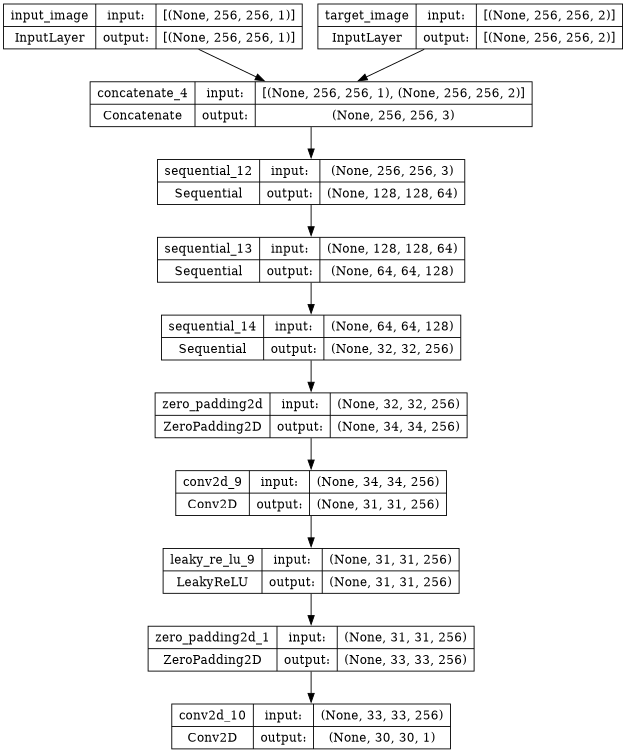

In [29]:
disc = discriminator()
disc.summary()
plot_model(disc, show_shapes=True, dpi = 64)

In [30]:
# disc.load_weights('/kaggle/input/imagenetmodelweights/disc_weight.keras')

In [31]:
# Function to create YUV image from Y, U, and V channels and then convert to rgb
def create_rgb_image(y_channel, uv_channel):
    # Assuming YUV format where Y, U, and V channels are separate
    # y_channel = np.array(y_channel)
    # uv_channel = np.array(uv_channel)
    u_channel, v_channel = tf.split(uv_channel, num_or_size_splits=2, axis=-1)

    # Combine Y, U, and V channels into a YUV image
    rgb_image = tf.image.yuv_to_rgb(tf.concat([y_channel, u_channel, v_channel], axis=-1))
    return rgb_image


In [32]:
LAMBDA = 150

In [33]:
# Define the perceptual loss function
def perceptual_loss(y_true, y_pred):
    vgg = VGG19(include_top=False, weights='imagenet', input_shape=(None, None, 3))
    vgg.trainable = False
    for layer in vgg.layers:
        layer.trainable = False
    model = Model(inputs=vgg.input, outputs=vgg.get_layer('block5_conv4').output)
    model.trainable = False

    y_true_features = model(y_true)
    y_pred_features = model(y_pred)

    return tf.reduce_mean(tf.square(y_true_features - y_pred_features))

In [34]:
def generator_loss(disc_generated_output,input_, gen_output, target):
    gan_loss = loss_function(tf.ones_like(disc_generated_output), disc_generated_output)
    l1_loss = tf.reduce_mean(tf.abs(target - gen_output))
    p_loss = perceptual_loss(create_rgb_image(input_, gen_output), create_rgb_image(input_, target))
    total_gen_loss = gan_loss + (LAMBDA * l1_loss) + 150*p_loss
    return total_gen_loss, gan_loss, l1_loss, p_loss

In [35]:
from keras.losses import BinaryCrossentropy
loss_function = BinaryCrossentropy(from_logits=True)

In [36]:
def discriminator_loss(disc_real_output, disc_generated_output):
    real_loss = loss_function(tf.ones_like(disc_real_output), disc_real_output)
    generated_loss = loss_function(tf.zeros_like(disc_generated_output), disc_generated_output)
    total_disc_loss = real_loss + generated_loss
    return total_disc_loss, real_loss, generated_loss

In [37]:
generator_optimizer = Adam(lr= 2e-4, beta_1=0.5)
discriminator_optimizer = Adam(lr = 2e-4, beta_1=0.5)

In [38]:
epochs = 250

In [39]:
# import tensorflow as tf
# from tensorflow.keras.applications import VGG19
# from tensorflow.keras.models import Model

# # Load the VGG19 model
# vgg = VGG19(weights='imagenet', include_top=False)

# # Select the layers you want to use for the LPIPS score
# selected_layers = ['block1_conv1', 'block2_conv1', 'block3_conv1']

# # Create a model that outputs the selected layers
# outputs = [vgg.get_layer(name).output for name in selected_layers]
# model = Model(inputs=vgg.input, outputs=outputs)

# # Make sure the VGG model is not trainable
# model.trainable = False

# def lpips_score(image1, image2):
#     # Get the features for both images
#     image1_features = model(image1)
#     image2_features = model(image2)

#     # Initialize the score
#     score = 0

#     # For each feature layer...
#     for f1, f2 in zip(image1_features, image2_features):
#         # ... compute the mean squared error between the features
#         mse = tf.reduce_mean((f1 - f2)**2)
#         # ... and add it to the score
#         score += mse

#     return score

In [40]:
# from tensorflow.keras.applications.inception_v3 import InceptionV3
# from scipy.linalg import sqrtm

# # Load the pre-trained InceptionV3 model (weights will be downloaded if not present)
# pretrained_model = InceptionV3(weights='imagenet', include_top=True, pooling='avg')

# # Optionally, you can freeze the layers to prevent training
# for layer in pretrained_model.layers:
#     layer.trainable = False


# # Create a new model to extract features from an intermediate layer
# inception_model = tf.keras.Model(inputs=pretrained_model.input, outputs=pretrained_model.get_layer('avg_pool').input)
# def calculate_fid_score(images1, images2, inception_model):
#     # Ensure the batch dimension is removed for individual image predictions
#     images1 = np.squeeze(images1, axis=0)
#     images2 = np.squeeze(images2, axis=0)
    
#     # Resize images to the required size for the Inception model
#     images1 = tf.image.resize(images1, size=(299, 299))
#     images2 = tf.image.resize(images2, size=(299, 299))
    
#     # Extract features using the Inception model
#     features1 = inception_model.predict(np.expand_dims(images1, axis=0))
#     features2 = inception_model.predict(np.expand_dims(images2, axis=0))

#     # Remove batch dimension from features
#     features1 = np.squeeze(features1, axis=0)
#     features2 = np.squeeze(features2, axis=0)
#     #print(features1.shape)
#     # Calculate mean and covariance of feature representations
#     mean1 = np.mean(features1, axis=(0, 1, 2))
#     mean2 = np.mean(features2, axis=(0, 1, 2))
#     #print(features1.shape)
#     cov1 = np.cov(features1.transpose(2, 0, 1).reshape(features1.shape[-1], -1), rowvar=False)
#     cov2 = np.cov(features2.transpose(2, 0, 1).reshape(features2.shape[-1], -1), rowvar=False)
#     #print(cov2.shape)

#     # Calculate the squared Euclidean distance between means
#     sum_squared_diff = np.sum((mean1 - mean2)**2)

#     # Calculate the trace of the product of covariances
#     cov_sqrt = sqrtm(np.dot(cov1, cov2))
#     trace_cov_product = np.trace(cov1 + cov2 - 2 * cov_sqrt)

#     # Calculate FID score
#     fid_score = np.real(sum_squared_diff + trace_cov_product)
    
#     return fid_score

In [41]:
@tf.function
def train_step(input_image, target, epoch, training_discriminator):
    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        gen_output = gen(input_image, training=True)
        disc_real_output = disc([input_image, target], training=True)
        disc_generated_output = disc([input_image, gen_output], training=True)
        gen_total_loss, gen_gan_loss, gen_l1_loss, gen_p_loss = generator_loss(disc_generated_output,input_image, gen_output, target)
        disc_loss, disc_real_loss, disc_generated_loss = discriminator_loss(disc_real_output, disc_generated_output)
        rgb_target = create_rgb_image(input_image, target)
        rgb_generated = create_rgb_image(input_image, gen_output)
        ssim_values = tf.image.ssim(rgb_target, rgb_generated, max_val=1.0)
        psnr_values = tf.image.psnr(rgb_target, rgb_generated, max_val=1.0)
#         lpips_values = lpips_score(rgb_target, rgb_generated)

        if epoch > 8:
            if training_discriminator:
                discriminator_gradients = disc_tape.gradient(disc_loss, disc.trainable_variables)
                discriminator_optimizer.apply_gradients(zip(discriminator_gradients, disc.trainable_variables))
            else:
                generator_gradients = gen_tape.gradient(gen_total_loss, gen.trainable_variables)
                generator_optimizer.apply_gradients(zip(generator_gradients, gen.trainable_variables))
        else:
            generator_gradients = gen_tape.gradient(gen_total_loss, gen.trainable_variables)
            discriminator_gradients = disc_tape.gradient(disc_loss, disc.trainable_variables)
            generator_optimizer.apply_gradients(zip(generator_gradients, gen.trainable_variables))
            discriminator_optimizer.apply_gradients(zip(discriminator_gradients, disc.trainable_variables))

        return gen_total_loss, gen_gan_loss, gen_l1_loss,gen_p_loss, disc_loss,disc_real_loss, disc_generated_loss, ssim_values, psnr_values, tf.constant([0])

In [42]:
@tf.function
def validation_step(input_image, target):
    # Generate output using the generator
    gen_output = gen(input_image)

    # Calculate losses without updating gradients
    disc_real_output = disc([input_image, target])
    disc_generated_output = disc([input_image, gen_output])

    gen_total_loss, gen_gan_loss, gen_l1_loss, gen_p_loss = generator_loss(disc_generated_output,input_image, gen_output, target)
    disc_loss,disc_real_loss, disc_generated_loss = discriminator_loss(disc_real_output, disc_generated_output)
    rgb_target = create_rgb_image(input_image, target)
    rgb_generated = create_rgb_image(input_image, gen_output)
    ssim_values = tf.image.ssim(rgb_target, rgb_generated, max_val=1.0)
    psnr_values = tf.image.psnr(rgb_target, rgb_generated, max_val=1.0)
#     lpips_values = lpips_score(rgb_target, rgb_generated)
    #accuracy = calculate_accuracy(disc_generated_output, disc_real_output)
    return gen_total_loss, gen_gan_loss, gen_l1_loss,gen_p_loss, disc_loss,disc_real_loss, disc_generated_loss, ssim_values, psnr_values, tf.constant([0])

In [43]:
# @tf.function
# def test_step(input_image, target):
#     # Generate output using the generator
#     gen_output = gen(input_image)

#     # Calculate losses without updating gradients
#     disc_real_output = disc([input_image, target])
#     disc_generated_output = disc([input_image, gen_output])

#     gen_total_loss, gen_gan_loss, gen_l1_loss, gen_p_loss = generator_loss(disc_generated_output,input_image, gen_output, target)
#     disc_loss,disc_real_loss, disc_generated_loss = discriminator_loss(disc_real_output, disc_generated_output)
#     rgb_target = create_rgb_image(input_image, target)
#     rgb_generated = create_rgb_image(input_image, gen_output)
#     ssim_values = tf.image.ssim(rgb_target, rgb_generated, max_val=1.0)
#     psnr_values = tf.image.psnr(rgb_target, rgb_generated, max_val=1.0)
#     lpips_values = lpips_score(rgb_target, rgb_generated)
#     fid_values = calculate_fid_score(rgb_target, rgb_generated, inception_model)
#     #accuracy = calculate_accuracy(disc_generated_output, disc_real_output)
#     return gen_total_loss, gen_gan_loss, gen_l1_loss,gen_p_loss, disc_loss,disc_real_loss, disc_generated_loss, ssim_values, psnr_values, lpips_values, fid_values


In [44]:
os.mkdir('/kaggle/working/gen_output/')

In [45]:
def display_one_random_test_image(input_, target, gen_model, epoch):
    print("Displaying one random test image...")
    img_array = np.array(input_)
    generated_output_test = gen_model(input_)
    ssim = tf.image.ssim(tf.reshape(create_rgb_image(input_, target), (256,256,3)), tf.reshape(create_rgb_image(input_,generated_output_test), (256,256,3)), max_val=1.0)
    psnr = tf.image.psnr(tf.reshape(create_rgb_image(input_, target), (256,256,3)), tf.reshape(create_rgb_image(input_,generated_output_test), (256,256,3)), max_val=1.0)  
#     lpips = lpips_score(tf.reshape(create_rgb_image(input_, target), (1,256,256,3)), tf.reshape(create_rgb_image(input_,generated_output_test), (1,256,256,3)))
#     p_loss = perceptual_loss(create_rgb_image(input_, target), create_rgb_image(input_, generated_output_test))
#     fid_score = calculate_fid_score(tf.reshape(create_rgb_image(input_, target), (1,256,256,3)), tf.reshape(create_rgb_image(input_,generated_output_test), (1,256,256,3)), inception_model)
    # print(input_.shape)
    input_ = np.squeeze(input_, axis=0)
    # print(type(input_), type(target))
    # print(input_.shape, input_)
    # input_.reshape((256,256))
    plt.figure(figsize=(16, 16))
    plt.subplot(1, 4, 1)
    plt.title('Input Testing Image')
    plt.imshow(input_, cmap='gray', vmax = 1, vmin = 0)  # Assuming images are normalized to [0, 1]
    plt.axis('off')
    # # print(target.shape)
    target = np.squeeze(target, axis=0)
    # # print(target.shape)
    target_img = create_rgb_image(input_, target).numpy()
    # # print(type(target_img))
    # target
    # # print(target_img.shape, target_img)
    plt.subplot(1, 4, 2)
    plt.title('Target Testing Image')
    plt.imshow(target_img)  # Assuming images are normalized to [0, 1]
    plt.axis('off')
    # # Convert PIL Image to NumPy array
    # img_array = np.array(input_)
    # # Add batch dimension
    # # print(img_array.shape)
    # img_array = np.expand_dims(img_array, axis=0)
    # # print(img_array.shape)
    # generated_output_test = gen_model(img_array)
    # # print(generated_output_test.shape)
    # # Squeeze the singleton dimension
    generated_output_test = np.squeeze(generated_output_test, axis=0)
    # # print(generated_output_test.shape)
    generated_img = create_rgb_image(input_, generated_output_test).numpy()
    # # print(generated_img.shape, generated_img)
    plt.subplot(1, 4, 3)
    plt.title(f'Generated Output -- epoch {epoch}')
    plt.imshow(generated_img)  # Assuming images are normalized to [-1, 1]
    plt.axis('off')
    plt.savefig(f'/kaggle/working/gen_output/epoch_{epoch}.png')
    plt.show()
    print('SSIM Score: {}'.format(ssim))
    print('PSNR Score: {}'.format(psnr))
#     print('LPIPS Score: {}'.format(lpips))
#     print('Perceptual Loss: {}'.format(p_loss))
#     print('FID Score: {}'.format(fid_score))

In [46]:
def display_random_test_image(gen_model, image_path, epoch):
    
    real_image = load(image_path)
    real_image = resize(real_image)
    real_image = normalize(real_image)
    yuv_image = tf.image.rgb_to_yuv(real_image)
    # Separate LAB into L and AB components
    Y_channel = tf.expand_dims(yuv_image[:, :, 0], axis=-1)  # L channel
    UV_channels = yuv_image[:, :, 1:] 

    # Display the image
    display_one_random_test_image(tf.reshape(Y_channel, (1,256,256,1)),tf.reshape(UV_channels,(1,256,256,2)), gen_model, epoch)


Displaying one random test image...


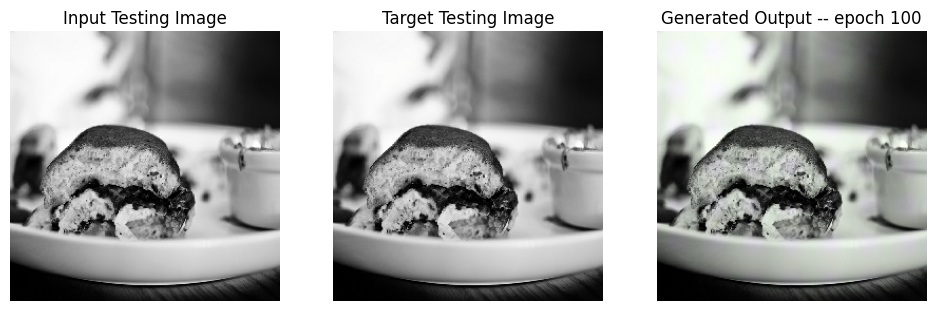

SSIM Score: 0.9485400319099426
PSNR Score: 36.663143157958984


In [47]:
display_random_test_image(gen, '/kaggle/input/coco2017/val2017/val2017/000000001425.jpg',100)

In [48]:
import random

each_epoch_train_generator_losses = []
each_epoch_train_generator_gan_losses = []
each_epoch_train_generator_l1_losses = []
each_epoch_train_generator_l2_losses = []
each_epoch_train_generator_perceptual_losses = []
each_epoch_train_discriminator_losses = []
each_epoch_train_discriminator_real_losses = []
each_epoch_train_discriminator_generated_losses = []
each_epoch_train_ssim = []
each_epoch_train_psnr = []
each_epoch_train_lpips = []
each_epoch_test_lpips = []
each_epoch_test_psnr = []
each_epoch_test_ssim = []
each_epoch_test_generator_losses = []
each_epoch_test_generator_gan_losses = []
each_epoch_test_generator_l1_losses = []
each_epoch_test_generator_l2_losses = []
each_epoch_test_generator_perceptual_losses = []
each_epoch_test_discriminator_losses = []
each_epoch_test_discriminator_real_losses = []
each_epoch_test_discriminator_generated_losses = []
train_generator_losses = []
train_generator_gan_losses = []
train_generator_l1_losses = []
train_generator_l2_losses = []
train_generator_perceptual_losses = []
train_discriminator_losses = []
train_discriminator_real_losses = []
train_discriminator_generated_losses = []
test_generator_losses = []
test_generator_gan_losses = []
test_generator_l1_losses = []
test_generator_l2_losses = []
test_generator_perceptual_losses = []
test_discriminator_losses = []
test_discriminator_real_losses = []
test_discriminator_generated_losses =[]
training_ssim = []
training_psnr = []
training_lpips = []
testing_ssim = []
testing_psnr = []
testing_lpips = []
each_epoch_all_records = []
all_records = []
def fit(train_ds, epochs, test_ds, gen_model):

    # Declare global lists
    global each_epoch_train_generator_losses, each_epoch_train_generator_gan_losses, each_epoch_train_generator_l1_losses, each_epoch_train_generator_l2_losses, each_epoch_train_generator_perceptual_losses, each_epoch_train_discriminator_losses,each_epoch_train_discriminator_real_losses, each_epoch_train_discriminator_generated_losses, each_epoch_train_ssim, each_epoch_train_psnr
    global each_epoch_test_psnr, each_epoch_test_ssim, each_epoch_test_generator_losses, each_epoch_test_generator_gan_losses, each_epoch_test_generator_l1_losses, each_epoch_test_generator_l2_losses, each_epoch_test_generator_perceptual_losses, each_epoch_test_discriminator_losses, each_epoch_test_discriminator_real_losses, each_epoch_test_discriminator_generated_losses
    global train_generator_losses, train_generator_gan_losses, train_generator_l1_losses, train_generator_l2_losses, train_generator_perceptual_losses, train_discriminator_losses, train_discriminator_real_losses, train_discriminator_generated_losses, test_generator_losses, test_generator_l2_losses, test_generator_gan_losses, test_generator_l1_losses, test_generator_perceptual_losses, test_discriminator_losses, test_discriminator_real_losses, test_discriminator_generated_losses
    global training_ssim, training_psnr, testing_ssim, testing_psnr, each_epoch_all_records, all_records, LAMBDA, each_epoch_train_lpips, each_epoch_test_lpips, training_lpips, testing_lpips


    # Initialize counters and flags
    consecutive_epochs_high_loss = 0
    training_discriminator = True
    stop_training = False
    min_learning_rate = 1e-7  # Set your desired minimum learning rate
    time_start = time.time()
    
    for ep in range(epochs):
        epoch = ep 
        start = time.time()
        train_count = 0
        test_count = 0

        print(f"Epoch {epoch}")

        for n, (input_, target) in train_ds.enumerate():
            if epoch > 10:
                train_gen_loss, train_gen_gan_loss, train_gen_l1_loss,train_gen_perceptual_loss, train_disc_loss, train_disc_real_loss, train_disc_generated_loss, train_ssim, train_psnr, train_lpips = train_step(input_, target, epoch, training_discriminator=training_discriminator)

            else:
                # If epoch is less than or equal to 10, train both generator and discriminator
                train_gen_loss, train_gen_gan_loss, train_gen_l1_loss, train_gen_perceptual_loss, train_disc_loss, train_disc_real_loss, train_disc_generated_loss, train_ssim, train_psnr, train_lpips  = train_step(input_, target, epoch, training_discriminator=None)

            each_epoch_train_generator_losses.append(train_gen_loss)
            each_epoch_train_generator_gan_losses.append(train_gen_gan_loss)
            each_epoch_train_generator_l1_losses.append(train_gen_l1_loss)
#             each_epoch_train_generator_l2_losses.append(train_gen_l2_loss)
            each_epoch_train_generator_perceptual_losses.append(train_gen_perceptual_loss)
            each_epoch_train_discriminator_losses.append(train_disc_loss)
            each_epoch_train_discriminator_real_losses.append(train_disc_real_loss)
            each_epoch_train_discriminator_generated_losses.append(train_disc_generated_loss)
            each_epoch_train_ssim.append(tf.reduce_mean(train_ssim.numpy()))
            each_epoch_train_psnr.append(tf.reduce_mean(train_psnr.numpy()))
            each_epoch_train_lpips.append(tf.reduce_mean(train_lpips.numpy()))
#             print(train_count)
            train_count += 1
#             print(n)
        #each_epoch_train_generator_losses = np.array(each_epoch_train_generator_losses)
        #print(each_epoch_train_discriminator_losses.shape())
        #print(each_epoch_train_generator_losses.shape())
        #print(each_epoch_train_ssim())
        print("Training Details")
        print("Generator-- total_loss:{:.5f} gan_loss:{:.5f} l1_loss:{:.5f} perceptual_loss:{:.5f} Discriminator-- total_loss:{:.5f} real_loss:{:.5f} generated_loss:{:.5f} --- SSIM {:.5f} PSNR {:.5f} LPIPS {:.5f}".format(np.mean(each_epoch_train_generator_losses),np.mean(each_epoch_train_generator_gan_losses), np.mean(each_epoch_train_generator_l1_losses),np.mean(each_epoch_train_generator_perceptual_losses), np.mean(each_epoch_train_discriminator_losses), np.mean(each_epoch_train_discriminator_generated_losses), np.mean(each_epoch_train_discriminator_real_losses), np.mean(each_epoch_train_ssim), np.mean(each_epoch_train_psnr), np.mean(each_epoch_train_lpips)))
        print("Time taken for epoch {} is {} sec".format(epoch + 1, time.time() - start))
        print(f"Number of iteration {train_count}")

        train_generator_losses.append(np.mean(each_epoch_train_generator_losses))
        train_generator_gan_losses.append(np.mean(each_epoch_train_generator_gan_losses))
        train_generator_l1_losses.append(np.mean(each_epoch_train_generator_l1_losses))
#         train_generator_l2_losses.append(np.mean(each_epoch_train_generator_l2_losses))
        train_generator_perceptual_losses.append(np.mean(each_epoch_train_generator_perceptual_losses))
        train_discriminator_losses.append(np.mean(each_epoch_train_discriminator_losses))
        train_discriminator_real_losses.append(np.mean(each_epoch_train_discriminator_real_losses))
        train_discriminator_generated_losses.append(np.mean(each_epoch_train_discriminator_generated_losses))
        training_ssim.append(np.mean(each_epoch_train_ssim))
        training_psnr.append(np.mean(each_epoch_train_psnr))
        training_lpips.append(np.mean(each_epoch_train_lpips))

        # Test
        for n, (input_, target) in test_ds.enumerate():
            test_gen_loss, test_gen_gan_loss, test_gen_l1_loss, test_gen_perceptual_loss, test_disc_loss, test_disc_real_loss, test_disc_generated_loss, test_ssim, test_psnr, test_lpips = validation_step(input_, target)
            test_count += 1

            each_epoch_test_generator_losses.append(test_gen_loss)
            each_epoch_test_generator_gan_losses.append(test_gen_gan_loss)
            each_epoch_test_generator_l1_losses.append(test_gen_l1_loss)
#             each_epoch_test_generator_l2_losses.append(test_gen_l2_loss)
            each_epoch_test_generator_perceptual_losses.append(test_gen_perceptual_loss)
            each_epoch_test_discriminator_losses.append(test_disc_loss)
            each_epoch_test_discriminator_real_losses.append(test_disc_real_loss)
            each_epoch_test_discriminator_generated_losses.append(test_disc_generated_loss)
            each_epoch_test_ssim.append(tf.reduce_mean(test_ssim.numpy()))
            each_epoch_test_psnr.append(tf.reduce_mean(test_psnr.numpy()))
            each_epoch_test_lpips.append(tf.reduce_mean(test_lpips.numpy()))
    
        print("Validation Details")
        print("Generator-- total_loss:{:.5f} gan_loss:{:.5f} l1_loss:{:.5f}  perceptual_loss:{:.5f} Discriminator-- total_loss:{:.5f} real_loss:{:.5f} generated_loss:{:.5f} --- SSIM {:.5f} PSNR {:.5f} LPIPS {:.5f}".format(np.mean(each_epoch_test_generator_losses),np.mean(each_epoch_test_generator_gan_losses), np.mean(each_epoch_test_generator_l1_losses), np.mean(each_epoch_test_generator_perceptual_losses),np.mean(each_epoch_test_discriminator_losses), np.mean(each_epoch_test_discriminator_generated_losses), np.mean(each_epoch_test_discriminator_real_losses), np.mean(each_epoch_test_ssim), np.mean(each_epoch_test_psnr), np.mean(each_epoch_test_lpips)))
        print("Time taken for epoch {} is {} sec".format(epoch+1, time.time() - start))
        print(f"Number of iteration {test_count}")
#         LAMBDA = LAMBDA * 1.006
        test_generator_losses.append(np.mean(each_epoch_test_generator_losses))
        test_generator_gan_losses.append(np.mean(each_epoch_test_generator_gan_losses))
        test_generator_l1_losses.append(np.mean(each_epoch_test_generator_l1_losses))
#         test_generator_l2_losses.append(np.mean(each_epoch_test_generator_l2_losses))
        test_generator_perceptual_losses.append(np.mean(each_epoch_test_generator_perceptual_losses))
        test_discriminator_losses.append(np.mean(each_epoch_test_discriminator_losses))
        test_discriminator_real_losses.append(np.mean(each_epoch_test_discriminator_real_losses))
        test_discriminator_generated_losses.append(np.mean(each_epoch_test_discriminator_generated_losses))
        testing_ssim.append(np.mean(each_epoch_test_ssim))
        testing_psnr.append(np.mean(each_epoch_test_psnr))
        testing_lpips.append(np.mean(each_epoch_test_lpips))

        each_epoch_all_records.append([np.mean(each_epoch_train_generator_losses),np.mean(each_epoch_train_generator_gan_losses), np.mean(each_epoch_train_generator_l1_losses),np.mean(each_epoch_train_generator_perceptual_losses), np.mean(each_epoch_train_discriminator_losses), np.mean(each_epoch_train_discriminator_generated_losses), np.mean(each_epoch_train_discriminator_real_losses), np.mean(each_epoch_train_ssim), np.mean(each_epoch_train_psnr), np.mean(each_epoch_test_generator_losses),np.mean(each_epoch_test_generator_gan_losses), np.mean(each_epoch_test_generator_l1_losses),np.mean(each_epoch_test_generator_perceptual_losses),np.mean(each_epoch_test_discriminator_losses), np.mean(each_epoch_test_discriminator_generated_losses), np.mean(each_epoch_test_discriminator_real_losses), np.mean(each_epoch_test_ssim), np.mean(each_epoch_test_psnr)])
        all_records.append(each_epoch_all_records)
        # emptying for next epoch
        each_epoch_test_ssim = []
        each_epoch_test_generator_losses = []
        each_epoch_test_generator_gan_losses = []
        each_epoch_test_generator_l1_losses = []
#         each_epoch_test_generator_l2_losses = []
        each_epoch_test_generator_perceptual_losses = []
        each_epoch_test_discriminator_losses = []
        each_epoch_test_discriminator_real_losses = []
        each_epoch_test_discriminator_generated_losses = []
        each_epoch_test_psnr = []
        each_epoch_test_lpips = []
        each_epoch_all_records = []
        #emptyling list for next iteration
        each_epoch_train_generator_losses = []
        each_epoch_train_generator_gan_losses = []
        each_epoch_train_generator_l1_losses = []
#         each_epoch_train_generator_l2_losses = []
        each_epoch_train_generator_perceptual_losses = []
        each_epoch_train_discriminator_losses = []
        each_epoch_train_discriminator_real_losses = []
        each_epoch_train_discriminator_generated_losses = []
        each_epoch_train_ssim = []
        each_epoch_train_psnr = []
        each_epoch_train_lpips = []
        if time.time() - time_start > 41000:
            stop_training = True
        if epoch == 0 or epoch % 3 == 0:
            # Function to display one random test image
            # def display_random_test_image(images, labels, gen_model):
            #     # Randomly select an index
            #     random_test_image_idx = random.randint(0, len(images) - 1)

            #     # Extract input and target from the selected index
            #     random_test_input = images[random_test_image_idx]
            #     random_test_target = labels[random_test_image_idx]

            #     # Display the image
            #     display_one_random_test_image(random_test_input, random_test_target, gen_model)

            # Example usage
            display_random_test_image(gen, '/kaggle/input/coco2017/val2017/val2017/000000001425.jpg', epoch+1)
        # Check if the difference between two consecutive epochs for the last 5 epochs is less than 1
        if ep > 10:
            # Check 1f the difference between two consecutive epochs for the last S epochs is less than 1 or 0.3
            last_epochs_losses = train_discriminator_losses[-5:] if training_discriminator else train_generator_losses[-5:]
            if all(((last_epochs_losses[i] - last_epochs_losses[i - 1])) < 0.01 if training_discriminator else ((last_epochs_losses[1] - last_epochs_losses[i - 1])) < 0.05 for i in range(1, 5)):
                consecutive_epochs_high_loss += 1
            else:
                consecutive_epochs_high_loss = 0
        
        
#         LAMBDA = LAMBDA*1.003
            # If the condition is met for 4 consecutive epochs, reduce the learning rate
        if consecutive_epochs_high_loss == 4:
            if training_discriminator:
                current_lr = generator_optimizer. learning_rate.numpy()
                new_lr = max (current_lr * 0.45, min_learning_rate)
                if new_lr > min_learning_rate:
                    generator_optimizer.learning_rate.assign(new_lr)
                    print (f"Reduced generator learning rate to {new_lr} at epoch {epoch + 1}")
                    # Switch training focus
                    training_discriminator = not training_discriminator
                else:
                    print(f"Generator learning rate already at the minimum. Stopping training.")
                    stop_training = True
            else:
                current_lr = discriminator_optimizer.learning_rate.numpy()
                new_lr = max (current_lr * 0.3, min_learning_rate)
                if new_lr > min_learning_rate:
                    discriminator_optimizer.learning_rate.assign(new_lr)
                    print(f"Reduced discriminator learning rate to {new_lr} at epoch {epoch + 1}.")
                    # Switch training focus
                    training_discriminator = not training_discriminator
                else:
                    print(f"Discriminator learning rate already at the minimum. Stopping training.")
                    stop_training = True

                consecutive_epochs_high_loss = 0
        # Check the flag variable
        if stop_training:
            break

In [49]:
tf.config.run_functions_eagerly(True)

Epoch 0
80134624/80134624 [==============================] - 0s 0us/step
Training Details
Generator-- total_loss:10.83586 gan_loss:1.52481 l1_loss:0.05141 perceptual_loss:0.01066 Discriminator-- total_loss:1.19292 real_loss:0.58371 generated_loss:0.60921 --- SSIM 0.83026 PSNR 21.63296 LPIPS 0.00000
Time taken for epoch 1 is 645.2070007324219 sec
Number of iteration 500
Validation Details
Generator-- total_loss:10.52252 gan_loss:0.52477 l1_loss:0.05486  perceptual_loss:0.01179 Discriminator-- total_loss:1.48419 real_loss:1.01884 generated_loss:0.46535 --- SSIM 0.89060 PSNR 21.39504 LPIPS 0.00000
Time taken for epoch 1 is 691.4780676364899 sec
Number of iteration 63
Displaying one random test image...


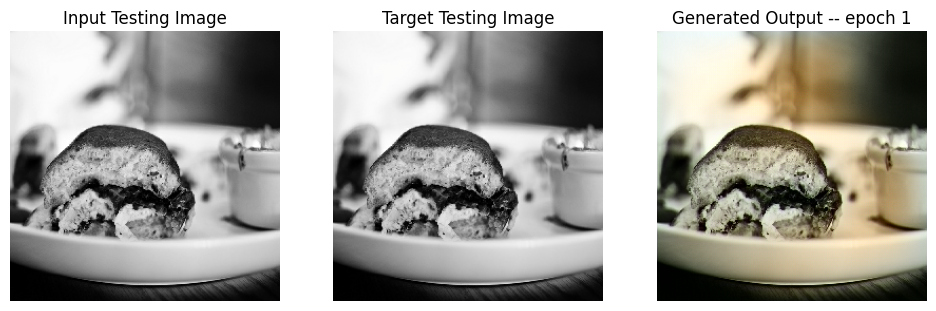

SSIM Score: 0.9429357051849365
PSNR Score: 23.294340133666992
Epoch 1
Training Details
Generator-- total_loss:10.32740 gan_loss:1.33561 l1_loss:0.05018 perceptual_loss:0.00976 Discriminator-- total_loss:1.20951 real_loss:0.59883 generated_loss:0.61068 --- SSIM 0.88206 PSNR 21.57774 LPIPS 0.00000
Time taken for epoch 2 is 633.9778211116791 sec
Number of iteration 500
Validation Details
Generator-- total_loss:40.59426 gan_loss:1.64113 l1_loss:0.24195  perceptual_loss:0.01774 Discriminator-- total_loss:1.07904 real_loss:0.57802 generated_loss:0.50102 --- SSIM 0.60477 PSNR 9.91812 LPIPS 0.00000
Time taken for epoch 2 is 678.340788602829 sec
Number of iteration 63
Epoch 2
Training Details
Generator-- total_loss:10.13478 gan_loss:1.27364 l1_loss:0.04947 perceptual_loss:0.00961 Discriminator-- total_loss:1.17844 real_loss:0.56834 generated_loss:0.61010 --- SSIM 0.88682 PSNR 21.60651 LPIPS 0.00000
Time taken for epoch 3 is 633.911993265152 sec
Number of iteration 500
Validation Details
Generat

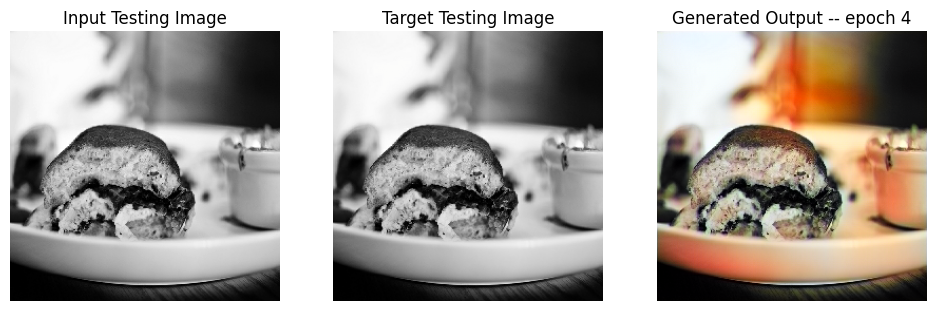

SSIM Score: 0.920508623123169
PSNR Score: 17.8791561126709
Epoch 4
Training Details
Generator-- total_loss:10.15823 gan_loss:1.29849 l1_loss:0.04914 perceptual_loss:0.00992 Discriminator-- total_loss:1.15564 real_loss:0.55898 generated_loss:0.59665 --- SSIM 0.88620 PSNR 21.58085 LPIPS 0.00000
Time taken for epoch 5 is 633.6501014232635 sec
Number of iteration 500
Validation Details
Generator-- total_loss:17.44915 gan_loss:1.37931 l1_loss:0.09398  perceptual_loss:0.01315 Discriminator-- total_loss:1.27622 real_loss:0.45889 generated_loss:0.81733 --- SSIM 0.81411 PSNR 16.08602 LPIPS 0.00000
Time taken for epoch 5 is 678.0907907485962 sec
Number of iteration 63
Epoch 5
Training Details
Generator-- total_loss:10.08762 gan_loss:1.22253 l1_loss:0.04914 perceptual_loss:0.00996 Discriminator-- total_loss:1.14932 real_loss:0.55183 generated_loss:0.59749 --- SSIM 0.88156 PSNR 21.51420 LPIPS 0.00000
Time taken for epoch 6 is 637.3533370494843 sec
Number of iteration 500
Validation Details
Generat

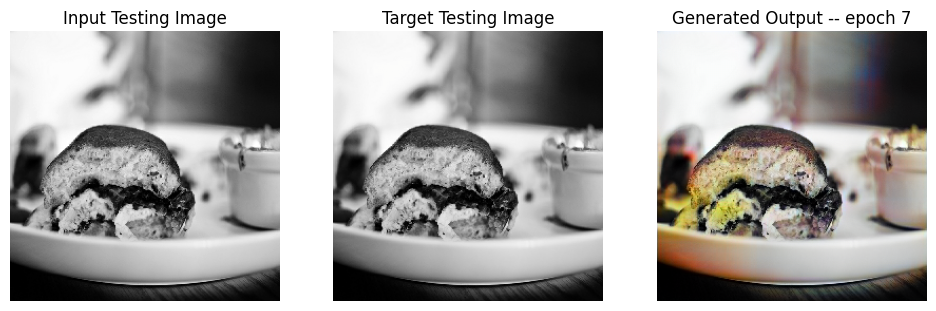

SSIM Score: 0.9669684767723083
PSNR Score: 24.903926849365234
Epoch 7
Training Details
Generator-- total_loss:10.03531 gan_loss:1.21359 l1_loss:0.04887 perceptual_loss:0.00994 Discriminator-- total_loss:1.18143 real_loss:0.56520 generated_loss:0.61623 --- SSIM 0.88140 PSNR 21.53838 LPIPS 0.00000
Time taken for epoch 8 is 642.8674502372742 sec
Number of iteration 500
Validation Details
Generator-- total_loss:27.54994 gan_loss:1.08773 l1_loss:0.14478  perceptual_loss:0.03163 Discriminator-- total_loss:2.18930 real_loss:0.85351 generated_loss:1.33578 --- SSIM 0.57689 PSNR 12.35854 LPIPS 0.00000
Time taken for epoch 8 is 687.0999672412872 sec
Number of iteration 63
Epoch 8
Training Details
Generator-- total_loss:10.10005 gan_loss:1.20078 l1_loss:0.04935 perceptual_loss:0.00998 Discriminator-- total_loss:1.17835 real_loss:0.57069 generated_loss:0.60766 --- SSIM 0.88190 PSNR 21.42610 LPIPS 0.00000
Time taken for epoch 9 is 644.1088461875916 sec
Number of iteration 500
Validation Details
Gene

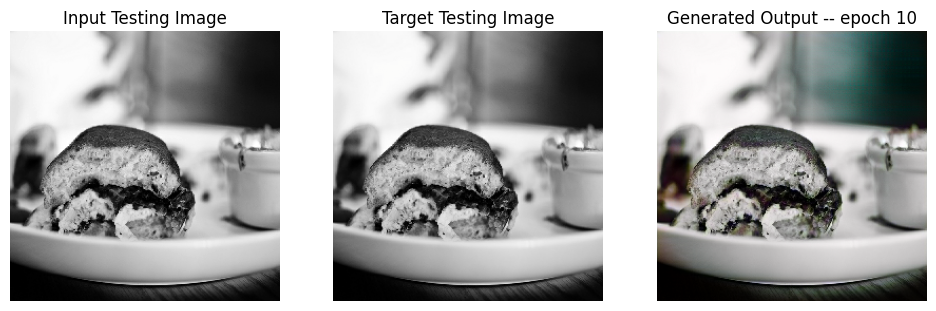

SSIM Score: 0.9692376255989075
PSNR Score: 32.98625564575195
Epoch 10
Training Details
Generator-- total_loss:8.93578 gan_loss:0.64810 l1_loss:0.04578 perceptual_loss:0.00947 Discriminator-- total_loss:1.37159 real_loss:0.92106 generated_loss:0.45053 --- SSIM 0.89038 PSNR 22.28146 LPIPS 0.00000
Time taken for epoch 11 is 567.0876023769379 sec
Number of iteration 500
Validation Details
Generator-- total_loss:11.96905 gan_loss:0.44685 l1_loss:0.06423  perceptual_loss:0.01258 Discriminator-- total_loss:1.73435 real_loss:1.20752 generated_loss:0.52683 --- SSIM 0.83640 PSNR 20.13996 LPIPS 0.00000
Time taken for epoch 11 is 611.338707447052 sec
Number of iteration 63
Epoch 11
Training Details
Generator-- total_loss:17.59646 gan_loss:9.16865 l1_loss:0.04618 perceptual_loss:0.01000 Discriminator-- total_loss:0.03421 real_loss:0.01802 generated_loss:0.01620 --- SSIM 0.88802 PSNR 22.13591 LPIPS 0.00000
Time taken for epoch 12 is 428.3943681716919 sec
Number of iteration 500
Validation Details
Ge

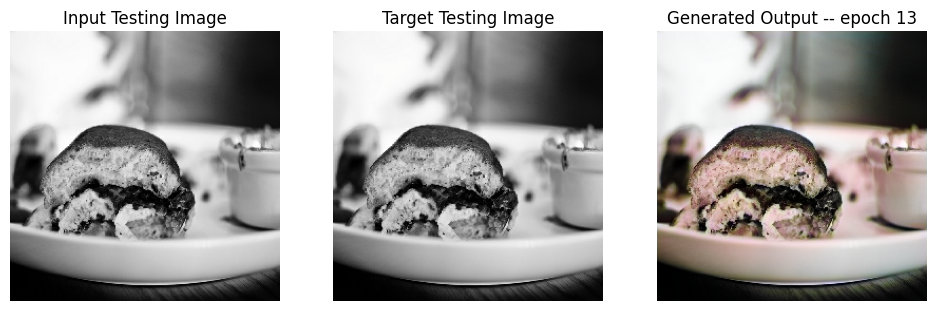

SSIM Score: 0.9852914810180664
PSNR Score: 28.23663902282715
Epoch 13
Training Details
Generator-- total_loss:20.92164 gan_loss:12.43737 l1_loss:0.04671 perceptual_loss:0.00985 Discriminator-- total_loss:0.00028 real_loss:0.00011 generated_loss:0.00017 --- SSIM 0.88760 PSNR 22.12081 LPIPS 0.00000
Time taken for epoch 14 is 425.1525185108185 sec
Number of iteration 500
Validation Details
Generator-- total_loss:11.11261 gan_loss:1.43312 l1_loss:0.05373  perceptual_loss:0.01080 Discriminator-- total_loss:1.41555 real_loss:0.86544 generated_loss:0.55011 --- SSIM 0.87913 PSNR 21.66669 LPIPS 0.00000
Time taken for epoch 14 is 468.30779933929443 sec
Number of iteration 63
Epoch 14
Training Details
Generator-- total_loss:22.40654 gan_loss:13.97126 l1_loss:0.04630 perceptual_loss:0.00994 Discriminator-- total_loss:0.00008 real_loss:0.00003 generated_loss:0.00005 --- SSIM 0.88877 PSNR 22.14577 LPIPS 0.00000
Time taken for epoch 15 is 429.4346807003021 sec
Number of iteration 500
Validation Detai

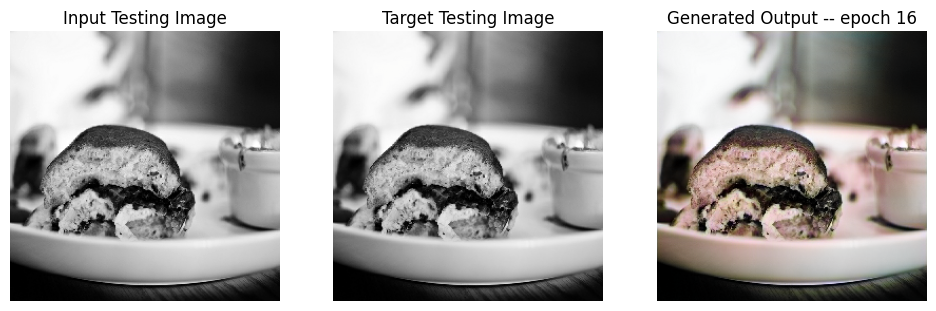

SSIM Score: 0.9853515625
PSNR Score: 28.23477554321289
Epoch 16
Training Details
Generator-- total_loss:20.18378 gan_loss:11.80710 l1_loss:0.04611 perceptual_loss:0.00973 Discriminator-- total_loss:0.95644 real_loss:0.39149 generated_loss:0.56494 --- SSIM 0.88819 PSNR 22.22796 LPIPS 0.00000
Time taken for epoch 17 is 429.5906472206116 sec
Number of iteration 500
Validation Details
Generator-- total_loss:11.54253 gan_loss:1.52900 l1_loss:0.05551  perceptual_loss:0.01124 Discriminator-- total_loss:1.78183 real_loss:0.95225 generated_loss:0.82958 --- SSIM 0.87083 PSNR 21.52023 LPIPS 0.00000
Time taken for epoch 17 is 473.1360638141632 sec
Number of iteration 63
Epoch 17
Training Details
Generator-- total_loss:17.44803 gan_loss:9.00886 l1_loss:0.04641 perceptual_loss:0.00985 Discriminator-- total_loss:0.01297 real_loss:0.00962 generated_loss:0.00335 --- SSIM 0.88794 PSNR 22.19799 LPIPS 0.00000
Time taken for epoch 18 is 424.78938269615173 sec
Number of iteration 500
Validation Details
Gene

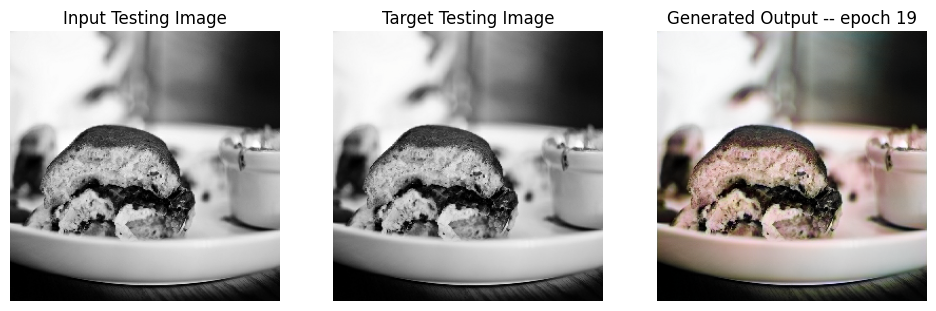

SSIM Score: 0.9852343201637268
PSNR Score: 28.216238021850586
Epoch 19
Training Details
Generator-- total_loss:20.17107 gan_loss:11.76493 l1_loss:0.04619 perceptual_loss:0.00985 Discriminator-- total_loss:0.00423 real_loss:0.00356 generated_loss:0.00067 --- SSIM 0.88860 PSNR 22.16903 LPIPS 0.00000
Time taken for epoch 20 is 430.0421733856201 sec
Number of iteration 500
Validation Details
Generator-- total_loss:13.80902 gan_loss:4.02007 l1_loss:0.05403  perceptual_loss:0.01123 Discriminator-- total_loss:1.96532 real_loss:0.29521 generated_loss:1.67010 --- SSIM 0.87187 PSNR 21.65128 LPIPS 0.00000
Time taken for epoch 20 is 474.6062898635864 sec
Number of iteration 63
Epoch 20
Training Details
Generator-- total_loss:22.41776 gan_loss:13.96562 l1_loss:0.04641 perceptual_loss:0.00994 Discriminator-- total_loss:0.12200 real_loss:0.06625 generated_loss:0.05575 --- SSIM 0.88776 PSNR 22.16283 LPIPS 0.00000
Time taken for epoch 21 is 433.14001989364624 sec
Number of iteration 500
Validation Deta

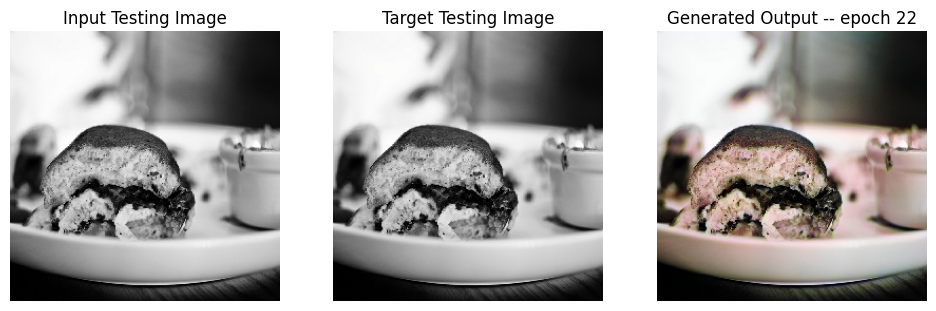

SSIM Score: 0.9850592613220215
PSNR Score: 28.097522735595703
Epoch 22
Training Details
Generator-- total_loss:23.19163 gan_loss:14.85319 l1_loss:0.04588 perceptual_loss:0.00971 Discriminator-- total_loss:0.00006 real_loss:0.00002 generated_loss:0.00004 --- SSIM 0.88903 PSNR 22.28677 LPIPS 0.00000
Time taken for epoch 23 is 435.2327792644501 sec
Number of iteration 500
Validation Details
Generator-- total_loss:15.63170 gan_loss:5.77393 l1_loss:0.05466  perceptual_loss:0.01106 Discriminator-- total_loss:3.23958 real_loss:0.22490 generated_loss:3.01468 --- SSIM 0.87650 PSNR 21.60397 LPIPS 0.00000
Time taken for epoch 23 is 481.89691066741943 sec
Number of iteration 63
Epoch 23
Training Details
Generator-- total_loss:24.62652 gan_loss:16.22825 l1_loss:0.04618 perceptual_loss:0.00980 Discriminator-- total_loss:0.00009 real_loss:0.00007 generated_loss:0.00002 --- SSIM 0.88808 PSNR 22.29317 LPIPS 0.00000
Time taken for epoch 24 is 442.5607097148895 sec
Number of iteration 500
Validation Deta

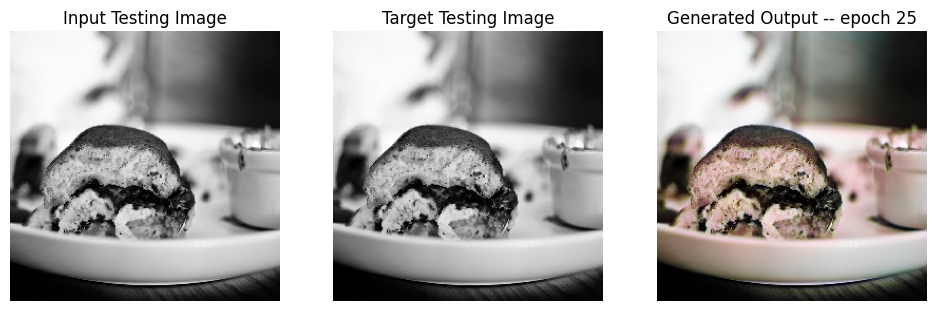

SSIM Score: 0.98517245054245
PSNR Score: 28.16638946533203
Epoch 25
Training Details
Generator-- total_loss:25.15794 gan_loss:16.70502 l1_loss:0.04656 perceptual_loss:0.00979 Discriminator-- total_loss:0.00007 real_loss:0.00001 generated_loss:0.00006 --- SSIM 0.88721 PSNR 22.18694 LPIPS 0.00000
Time taken for epoch 26 is 437.4046120643616 sec
Number of iteration 500
Validation Details
Generator-- total_loss:17.12626 gan_loss:7.58806 l1_loss:0.05257  perceptual_loss:0.01102 Discriminator-- total_loss:4.81968 real_loss:0.13931 generated_loss:4.68037 --- SSIM 0.88149 PSNR 21.69664 LPIPS 0.00000
Time taken for epoch 26 is 482.06193709373474 sec
Number of iteration 63
Epoch 26
Training Details
Generator-- total_loss:24.97877 gan_loss:16.50336 l1_loss:0.04660 perceptual_loss:0.00991 Discriminator-- total_loss:0.00002 real_loss:0.00001 generated_loss:0.00001 --- SSIM 0.88642 PSNR 22.14549 LPIPS 0.00000
Time taken for epoch 27 is 443.3028280735016 sec
Number of iteration 500
Validation Details

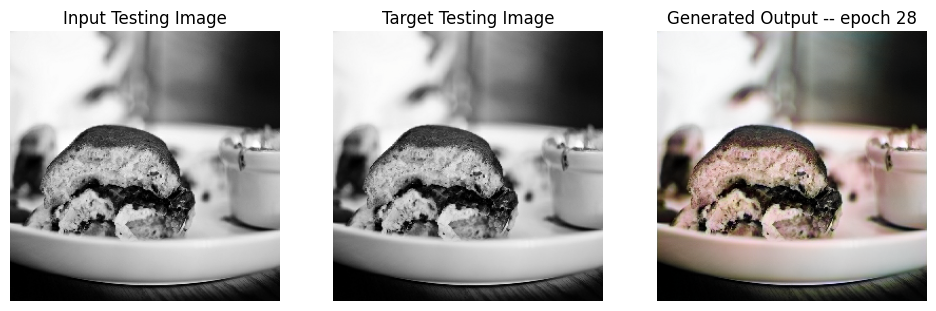

SSIM Score: 0.9852527976036072
PSNR Score: 28.18145179748535
Reduced generator learning rate to 0.0004500000213738531 at epoch 28
Epoch 28
Training Details
Generator-- total_loss:7.32356 gan_loss:0.04036 l1_loss:0.04004 perceptual_loss:0.00851 Discriminator-- total_loss:38.19949 real_loss:38.19948 generated_loss:0.00001 --- SSIM 0.91877 PSNR 23.62566 LPIPS 0.00000
Time taken for epoch 29 is 574.3795781135559 sec
Number of iteration 500
Validation Details
Generator-- total_loss:7.94264 gan_loss:0.00000 l1_loss:0.04310  perceptual_loss:0.00985 Discriminator-- total_loss:32.39123 real_loss:32.39112 generated_loss:0.00011 --- SSIM 0.92086 PSNR 23.39219 LPIPS 0.00000
Time taken for epoch 29 is 619.2405440807343 sec
Number of iteration 63
Epoch 29
Training Details
Generator-- total_loss:7.27378 gan_loss:0.00000 l1_loss:0.04009 perceptual_loss:0.00840 Discriminator-- total_loss:38.25423 real_loss:38.25422 generated_loss:0.00002 --- SSIM 0.91986 PSNR 23.59165 LPIPS 0.00000
Time taken for epoch

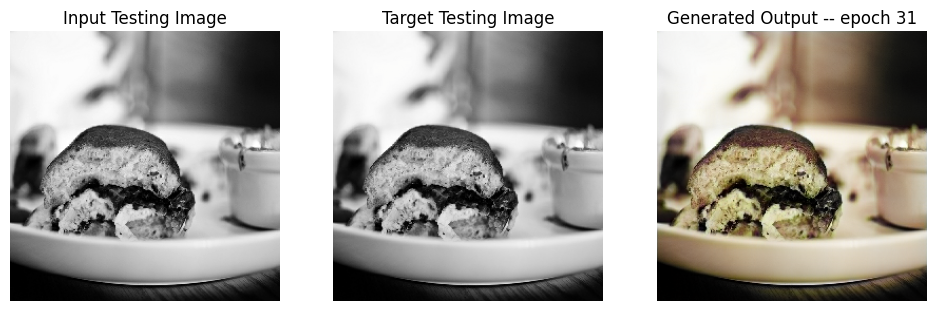

SSIM Score: 0.9738554954528809
PSNR Score: 23.529647827148438
Epoch 31
Training Details
Generator-- total_loss:7.13482 gan_loss:0.00000 l1_loss:0.03934 perceptual_loss:0.00822 Discriminator-- total_loss:37.47937 real_loss:37.47935 generated_loss:0.00002 --- SSIM 0.92182 PSNR 23.76269 LPIPS 0.00000
Time taken for epoch 32 is 562.3440997600555 sec
Number of iteration 500
Validation Details
Generator-- total_loss:8.04132 gan_loss:0.00000 l1_loss:0.04441  perceptual_loss:0.00920 Discriminator-- total_loss:35.59492 real_loss:35.59487 generated_loss:0.00005 --- SSIM 0.91715 PSNR 23.16202 LPIPS 0.00000
Time taken for epoch 32 is 605.1677148342133 sec
Number of iteration 63
Epoch 32
Training Details
Generator-- total_loss:7.16713 gan_loss:0.00000 l1_loss:0.03945 perceptual_loss:0.00833 Discriminator-- total_loss:37.47987 real_loss:37.47985 generated_loss:0.00002 --- SSIM 0.92160 PSNR 23.70907 LPIPS 0.00000
Time taken for epoch 33 is 564.3637652397156 sec
Number of iteration 500
Validation Deta

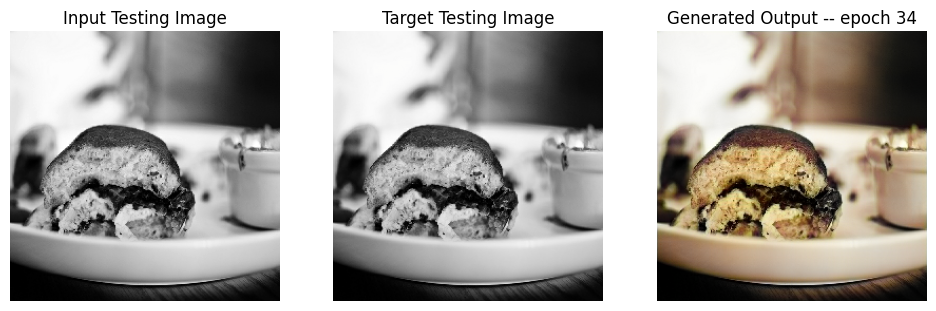

SSIM Score: 0.9675953388214111
PSNR Score: 22.251848220825195
Epoch 34
Training Details
Generator-- total_loss:7.09182 gan_loss:0.00000 l1_loss:0.03906 perceptual_loss:0.00822 Discriminator-- total_loss:37.38829 real_loss:37.38826 generated_loss:0.00003 --- SSIM 0.92220 PSNR 23.76043 LPIPS 0.00000
Time taken for epoch 35 is 558.4613621234894 sec
Number of iteration 500
Validation Details
Generator-- total_loss:8.13277 gan_loss:0.00000 l1_loss:0.04523  perceptual_loss:0.00899 Discriminator-- total_loss:34.87711 real_loss:34.87704 generated_loss:0.00007 --- SSIM 0.91816 PSNR 22.97849 LPIPS 0.00000
Time taken for epoch 35 is 601.4921135902405 sec
Number of iteration 63
Epoch 35
Training Details
Generator-- total_loss:7.05785 gan_loss:0.00000 l1_loss:0.03894 perceptual_loss:0.00811 Discriminator-- total_loss:37.38134 real_loss:37.38134 generated_loss:0.00000 --- SSIM 0.92274 PSNR 23.83322 LPIPS 0.00000
Time taken for epoch 36 is 559.5505783557892 sec
Number of iteration 500
Validation Deta

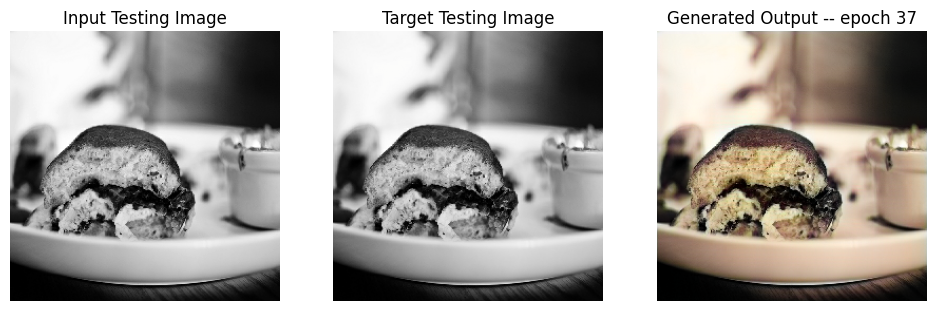

SSIM Score: 0.979015588760376
PSNR Score: 23.821306228637695
Epoch 37
Training Details
Generator-- total_loss:7.08589 gan_loss:0.00000 l1_loss:0.03905 perceptual_loss:0.00819 Discriminator-- total_loss:37.09780 real_loss:37.09779 generated_loss:0.00001 --- SSIM 0.92198 PSNR 23.78286 LPIPS 0.00000
Time taken for epoch 38 is 566.2638533115387 sec
Number of iteration 500
Validation Details
Generator-- total_loss:8.84145 gan_loss:0.00000 l1_loss:0.04959  perceptual_loss:0.00935 Discriminator-- total_loss:36.35220 real_loss:36.35212 generated_loss:0.00008 --- SSIM 0.91000 PSNR 21.74530 LPIPS 0.00000
Time taken for epoch 38 is 610.7620055675507 sec
Number of iteration 63
Epoch 38
Training Details
Generator-- total_loss:7.05821 gan_loss:0.00000 l1_loss:0.03893 perceptual_loss:0.00813 Discriminator-- total_loss:37.45116 real_loss:37.45115 generated_loss:0.00000 --- SSIM 0.92306 PSNR 23.82293 LPIPS 0.00000
Time taken for epoch 39 is 564.8923015594482 sec
Number of iteration 500
Validation Detai

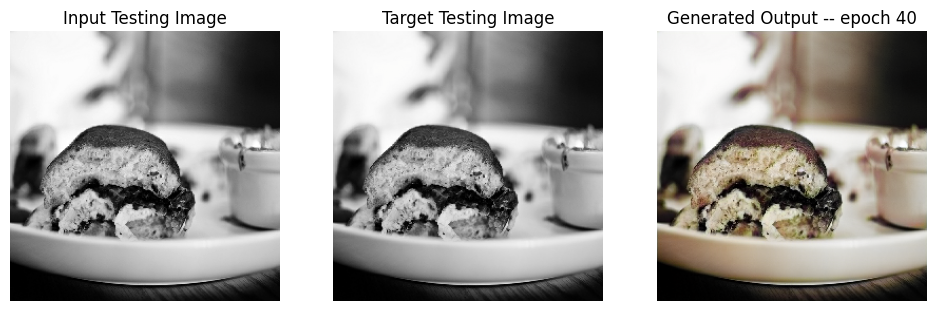

SSIM Score: 0.9844655990600586
PSNR Score: 26.624000549316406
Epoch 40
Training Details
Generator-- total_loss:7.08284 gan_loss:0.00000 l1_loss:0.03902 perceptual_loss:0.00820 Discriminator-- total_loss:36.96207 real_loss:36.96189 generated_loss:0.00018 --- SSIM 0.92201 PSNR 23.76658 LPIPS 0.00000
Time taken for epoch 41 is 565.1508684158325 sec
Number of iteration 500
Validation Details
Generator-- total_loss:7.94613 gan_loss:0.00000 l1_loss:0.04394  perceptual_loss:0.00904 Discriminator-- total_loss:33.70608 real_loss:33.70599 generated_loss:0.00009 --- SSIM 0.92090 PSNR 23.25888 LPIPS 0.00000
Time taken for epoch 41 is 609.1358766555786 sec
Number of iteration 63
Epoch 41
Training Details
Generator-- total_loss:7.05603 gan_loss:0.00000 l1_loss:0.03892 perceptual_loss:0.00812 Discriminator-- total_loss:37.22819 real_loss:37.22817 generated_loss:0.00002 --- SSIM 0.92243 PSNR 23.74650 LPIPS 0.00000
Time taken for epoch 42 is 567.8891954421997 sec
Number of iteration 500
Validation Deta

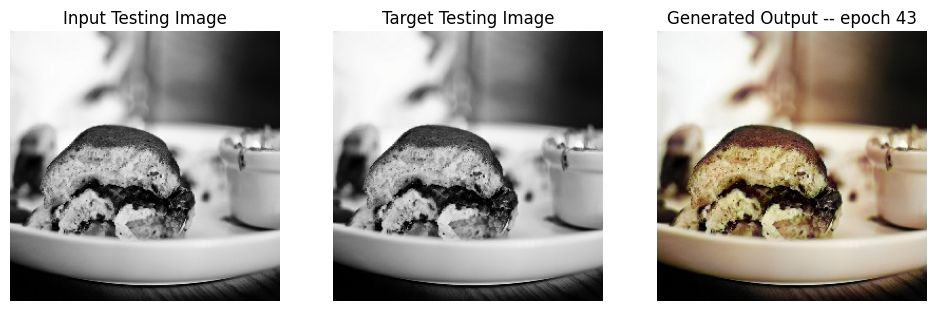

SSIM Score: 0.9658809304237366
PSNR Score: 22.722551345825195
Epoch 43
Training Details
Generator-- total_loss:7.08723 gan_loss:0.00000 l1_loss:0.03915 perceptual_loss:0.00810 Discriminator-- total_loss:37.28702 real_loss:37.28702 generated_loss:0.00000 --- SSIM 0.92183 PSNR 23.76817 LPIPS 0.00000
Time taken for epoch 44 is 563.1391756534576 sec
Number of iteration 500
Validation Details
Generator-- total_loss:7.45394 gan_loss:0.00000 l1_loss:0.04099  perceptual_loss:0.00871 Discriminator-- total_loss:32.71295 real_loss:32.71259 generated_loss:0.00036 --- SSIM 0.92731 PSNR 24.01029 LPIPS 0.00000
Time taken for epoch 44 is 606.9119808673859 sec
Number of iteration 63
Reduced discriminator learning rate to 0.0003000000142492354 at epoch 44.
Epoch 44
Training Details
Generator-- total_loss:13.71286 gan_loss:6.66517 l1_loss:0.03883 perceptual_loss:0.00816 Discriminator-- total_loss:0.27999 real_loss:0.18836 generated_loss:0.09163 --- SSIM 0.92256 PSNR 23.84994 LPIPS 0.00000
Time taken for 

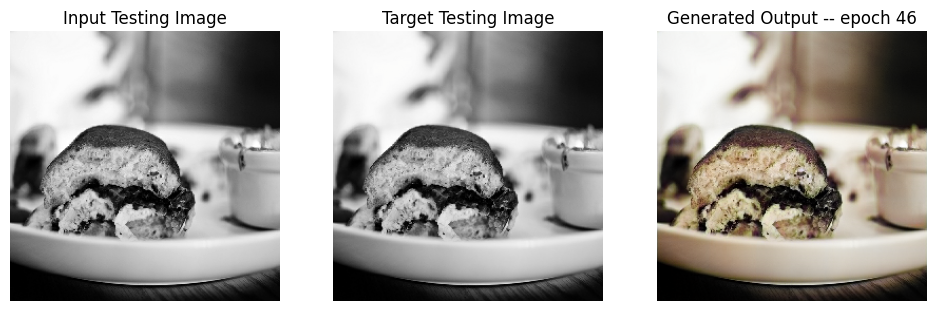

SSIM Score: 0.9820117950439453
PSNR Score: 25.451047897338867
Epoch 46
Training Details
Generator-- total_loss:17.79959 gan_loss:10.80254 l1_loss:0.03862 perceptual_loss:0.00802 Discriminator-- total_loss:0.01159 real_loss:0.00749 generated_loss:0.00409 --- SSIM 0.92337 PSNR 23.90979 LPIPS 0.00000
Time taken for epoch 47 is 427.77038836479187 sec
Number of iteration 500
Validation Details
Generator-- total_loss:7.89632 gan_loss:0.00817 l1_loss:0.04320  perceptual_loss:0.00939 Discriminator-- total_loss:6.58119 real_loss:6.56399 generated_loss:0.01720 --- SSIM 0.91816 PSNR 23.39448 LPIPS 0.00000
Time taken for epoch 47 is 471.86573910713196 sec
Number of iteration 63
Epoch 47
Training Details
Generator-- total_loss:18.92816 gan_loss:11.91496 l1_loss:0.03864 perceptual_loss:0.00811 Discriminator-- total_loss:0.00055 real_loss:0.00028 generated_loss:0.00027 --- SSIM 0.92283 PSNR 23.92448 LPIPS 0.00000
Time taken for epoch 48 is 426.76982069015503 sec
Number of iteration 500
Validation Det

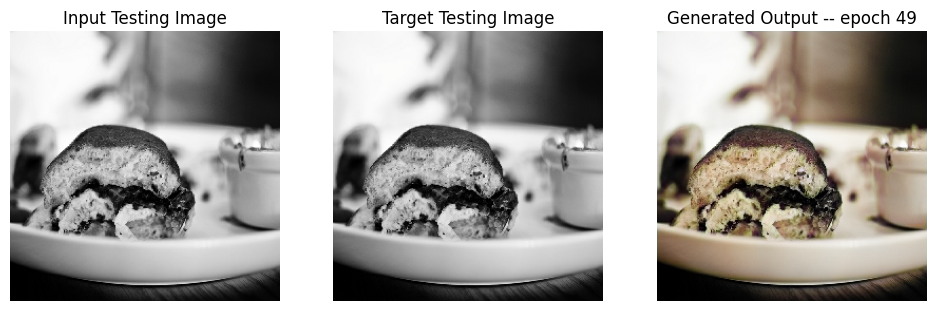

SSIM Score: 0.982196569442749
PSNR Score: 25.41961669921875
Epoch 49
Training Details
Generator-- total_loss:19.98968 gan_loss:12.98184 l1_loss:0.03864 perceptual_loss:0.00808 Discriminator-- total_loss:0.00024 real_loss:0.00012 generated_loss:0.00012 --- SSIM 0.92302 PSNR 23.87788 LPIPS 0.00000
Time taken for epoch 50 is 428.1129298210144 sec
Number of iteration 500
Validation Details
Generator-- total_loss:7.75688 gan_loss:0.00351 l1_loss:0.04259  perceptual_loss:0.00910 Discriminator-- total_loss:7.29410 real_loss:7.28863 generated_loss:0.00547 --- SSIM 0.92177 PSNR 23.49878 LPIPS 0.00000
Time taken for epoch 50 is 471.8358645439148 sec
Number of iteration 63
Epoch 50
Training Details
Generator-- total_loss:20.57614 gan_loss:13.59531 l1_loss:0.03847 perceptual_loss:0.00807 Discriminator-- total_loss:0.00022 real_loss:0.00010 generated_loss:0.00012 --- SSIM 0.92339 PSNR 23.96184 LPIPS 0.00000
Time taken for epoch 51 is 431.74997639656067 sec
Number of iteration 500
Validation Details

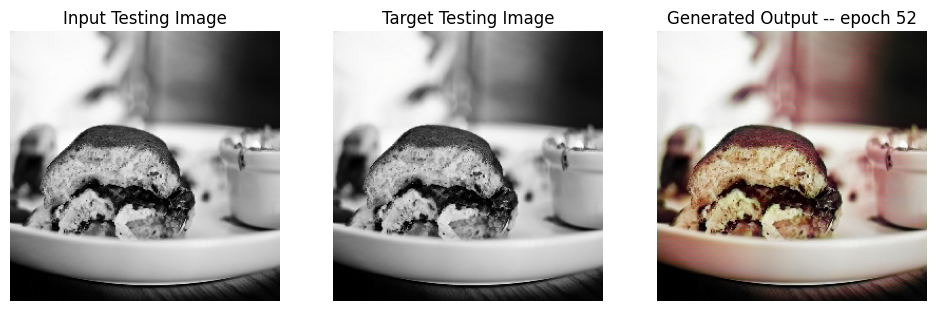

SSIM Score: 0.9594221711158752
PSNR Score: 24.038545608520508
Epoch 52
Training Details
Generator-- total_loss:7.01893 gan_loss:0.01833 l1_loss:0.03869 perceptual_loss:0.00798 Discriminator-- total_loss:9.78214 real_loss:9.78205 generated_loss:0.00008 --- SSIM 0.91835 PSNR 23.77785 LPIPS 0.00000
Time taken for epoch 53 is 569.3709740638733 sec
Number of iteration 500
Validation Details
Generator-- total_loss:8.22205 gan_loss:0.00013 l1_loss:0.04560  perceptual_loss:0.00922 Discriminator-- total_loss:13.90477 real_loss:13.90458 generated_loss:0.00018 --- SSIM 0.90680 PSNR 22.77732 LPIPS 0.00000
Time taken for epoch 53 is 613.8991792201996 sec
Number of iteration 63
Epoch 53
Training Details
Generator-- total_loss:7.04180 gan_loss:0.01396 l1_loss:0.03886 perceptual_loss:0.00799 Discriminator-- total_loss:9.72129 real_loss:9.72114 generated_loss:0.00015 --- SSIM 0.91753 PSNR 23.72909 LPIPS 0.00000
Time taken for epoch 54 is 568.239447593689 sec
Number of iteration 500
Validation Details
G

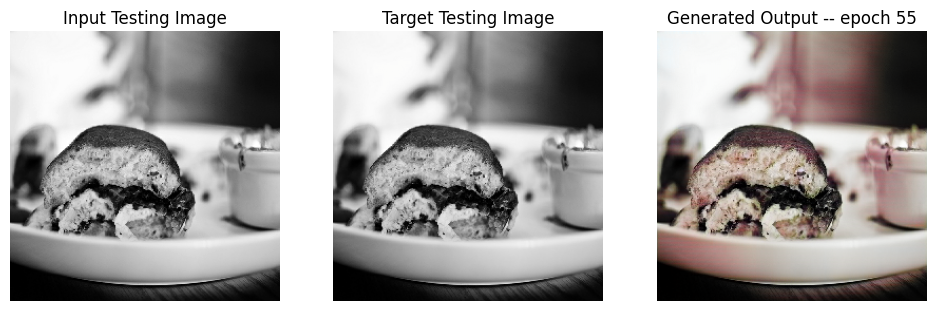

SSIM Score: 0.9760308265686035
PSNR Score: 27.59078025817871
Epoch 55
Training Details
Generator-- total_loss:7.13793 gan_loss:0.01205 l1_loss:0.03949 perceptual_loss:0.00802 Discriminator-- total_loss:9.09227 real_loss:9.09221 generated_loss:0.00006 --- SSIM 0.91642 PSNR 23.60871 LPIPS 0.00000
Time taken for epoch 56 is 566.3060390949249 sec
Number of iteration 500
Validation Details
Generator-- total_loss:8.20418 gan_loss:0.00014 l1_loss:0.04566  perceptual_loss:0.00903 Discriminator-- total_loss:14.37125 real_loss:14.37116 generated_loss:0.00010 --- SSIM 0.90801 PSNR 22.68218 LPIPS 0.00000
Time taken for epoch 56 is 610.1972367763519 sec
Number of iteration 63
Epoch 56
Training Details
Generator-- total_loss:7.11239 gan_loss:0.01236 l1_loss:0.03927 perceptual_loss:0.00806 Discriminator-- total_loss:9.25674 real_loss:9.25670 generated_loss:0.00004 --- SSIM 0.91640 PSNR 23.62812 LPIPS 0.00000
Time taken for epoch 57 is 565.0811936855316 sec
Number of iteration 500
Validation Details
G

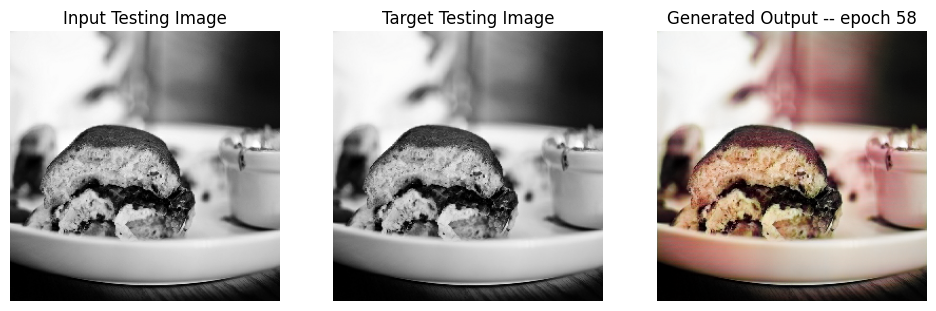

SSIM Score: 0.9521316885948181
PSNR Score: 22.831371307373047
Epoch 58
Training Details
Generator-- total_loss:7.08708 gan_loss:0.01195 l1_loss:0.03915 perceptual_loss:0.00802 Discriminator-- total_loss:9.27401 real_loss:9.27394 generated_loss:0.00007 --- SSIM 0.91691 PSNR 23.67789 LPIPS 0.00000
Time taken for epoch 59 is 558.2194588184357 sec
Number of iteration 500
Validation Details
Generator-- total_loss:7.79106 gan_loss:0.00008 l1_loss:0.04302  perceptual_loss:0.00892 Discriminator-- total_loss:14.84792 real_loss:14.84785 generated_loss:0.00008 --- SSIM 0.91686 PSNR 23.31656 LPIPS 0.00000
Time taken for epoch 59 is 601.4914467334747 sec
Number of iteration 63
Epoch 59
Training Details
Generator-- total_loss:7.04291 gan_loss:0.01133 l1_loss:0.03890 perceptual_loss:0.00798 Discriminator-- total_loss:8.45878 real_loss:8.45867 generated_loss:0.00011 --- SSIM 0.91860 PSNR 23.73023 LPIPS 0.00000
Time taken for epoch 60 is 568.3633387088776 sec
Number of iteration 500
Validation Details


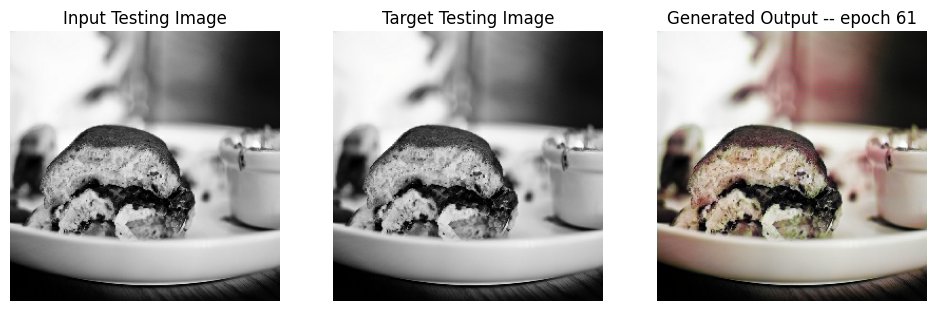

SSIM Score: 0.9760841727256775
PSNR Score: 26.717941284179688
Epoch 61
Training Details
Generator-- total_loss:6.99090 gan_loss:0.01185 l1_loss:0.03855 perceptual_loss:0.00798 Discriminator-- total_loss:8.85914 real_loss:8.85907 generated_loss:0.00007 --- SSIM 0.91839 PSNR 23.75376 LPIPS 0.00000
Time taken for epoch 62 is 564.5335235595703 sec
Number of iteration 500
Validation Details
Generator-- total_loss:8.17113 gan_loss:0.00008 l1_loss:0.04501  perceptual_loss:0.00947 Discriminator-- total_loss:14.36744 real_loss:14.36731 generated_loss:0.00014 --- SSIM 0.91335 PSNR 23.03499 LPIPS 0.00000
Time taken for epoch 62 is 607.4584994316101 sec
Number of iteration 63
Epoch 62
Training Details
Generator-- total_loss:7.12621 gan_loss:0.01262 l1_loss:0.03939 perceptual_loss:0.00804 Discriminator-- total_loss:9.39865 real_loss:9.39860 generated_loss:0.00005 --- SSIM 0.91658 PSNR 23.63468 LPIPS 0.00000
Time taken for epoch 63 is 563.7436571121216 sec
Number of iteration 500
Validation Details


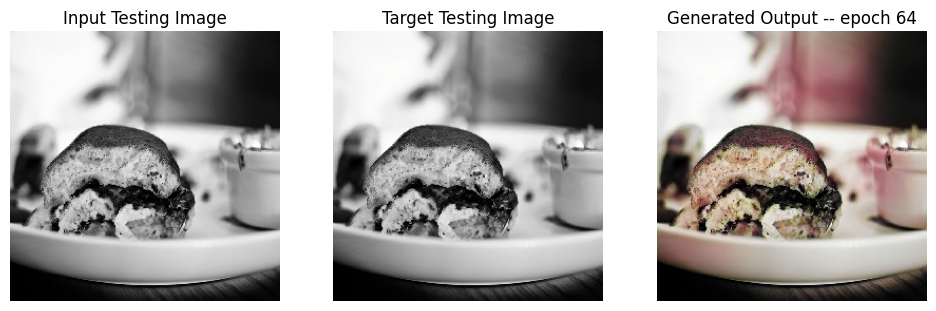

SSIM Score: 0.9684916138648987
PSNR Score: 25.668495178222656
Epoch 64
Training Details
Generator-- total_loss:7.04693 gan_loss:0.01006 l1_loss:0.03892 perceptual_loss:0.00799 Discriminator-- total_loss:8.84402 real_loss:8.84387 generated_loss:0.00014 --- SSIM 0.91747 PSNR 23.71558 LPIPS 0.00000
Time taken for epoch 65 is 567.8083972930908 sec
Number of iteration 500
Validation Details
Generator-- total_loss:7.83445 gan_loss:0.00009 l1_loss:0.04344  perceptual_loss:0.00878 Discriminator-- total_loss:14.59579 real_loss:14.59568 generated_loss:0.00012 --- SSIM 0.91677 PSNR 23.22728 LPIPS 0.00000
Time taken for epoch 65 is 611.1470103263855 sec
Number of iteration 63
Epoch 65
Training Details
Generator-- total_loss:6.92733 gan_loss:0.01033 l1_loss:0.03824 perceptual_loss:0.00788 Discriminator-- total_loss:8.37106 real_loss:8.37088 generated_loss:0.00018 --- SSIM 0.91942 PSNR 23.83265 LPIPS 0.00000
Time taken for epoch 66 is 564.0633144378662 sec
Number of iteration 500
Validation Details


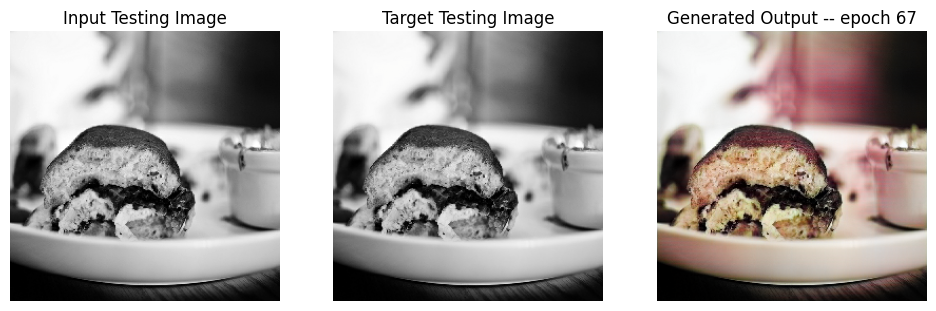

SSIM Score: 0.9548127055168152
PSNR Score: 23.600910186767578
Epoch 67
Training Details
Generator-- total_loss:7.00082 gan_loss:0.01111 l1_loss:0.03864 perceptual_loss:0.00796 Discriminator-- total_loss:9.08881 real_loss:9.08873 generated_loss:0.00008 --- SSIM 0.91862 PSNR 23.72933 LPIPS 0.00000
Time taken for epoch 68 is 570.8626594543457 sec
Number of iteration 500
Validation Details
Generator-- total_loss:8.34299 gan_loss:0.00015 l1_loss:0.04671  perceptual_loss:0.00891 Discriminator-- total_loss:14.41100 real_loss:14.41081 generated_loss:0.00019 --- SSIM 0.90772 PSNR 22.51118 LPIPS 0.00000
Time taken for epoch 68 is 613.7396550178528 sec
Number of iteration 63
Epoch 68
Training Details
Generator-- total_loss:7.03829 gan_loss:0.01031 l1_loss:0.03887 perceptual_loss:0.00798 Discriminator-- total_loss:8.43011 real_loss:8.43001 generated_loss:0.00009 --- SSIM 0.91840 PSNR 23.73821 LPIPS 0.00000
Time taken for epoch 69 is 559.9674906730652 sec
Number of iteration 500
Validation Details


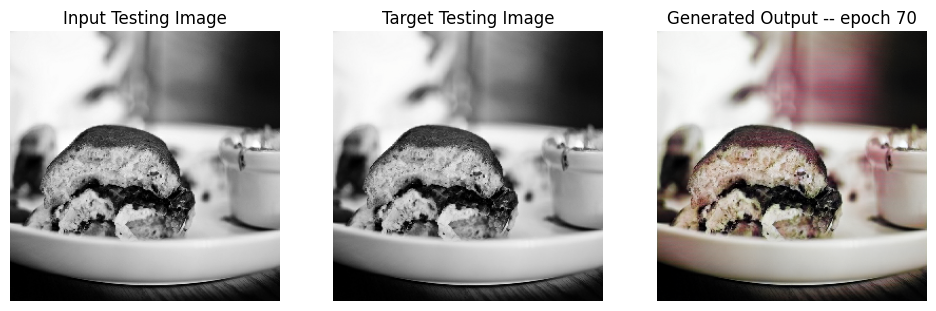

SSIM Score: 0.9675442576408386
PSNR Score: 27.5640926361084
Epoch 70
Training Details
Generator-- total_loss:7.04944 gan_loss:0.00953 l1_loss:0.03899 perceptual_loss:0.00794 Discriminator-- total_loss:8.62132 real_loss:8.62126 generated_loss:0.00006 --- SSIM 0.91724 PSNR 23.69846 LPIPS 0.00000
Time taken for epoch 71 is 567.4906027317047 sec
Number of iteration 500
Validation Details
Generator-- total_loss:8.09704 gan_loss:0.00006 l1_loss:0.04491  perceptual_loss:0.00907 Discriminator-- total_loss:15.44492 real_loss:15.44481 generated_loss:0.00011 --- SSIM 0.91532 PSNR 22.96190 LPIPS 0.00000
Time taken for epoch 71 is 610.4586610794067 sec
Number of iteration 63
Epoch 71
Training Details
Generator-- total_loss:7.02300 gan_loss:0.01091 l1_loss:0.03882 perceptual_loss:0.00793 Discriminator-- total_loss:8.62550 real_loss:8.62537 generated_loss:0.00013 --- SSIM 0.91792 PSNR 23.73751 LPIPS 0.00000
Time taken for epoch 72 is 570.8418605327606 sec
Number of iteration 500
Validation Details
Ge

In [50]:
fit(train_dataset, epochs, val, gen)

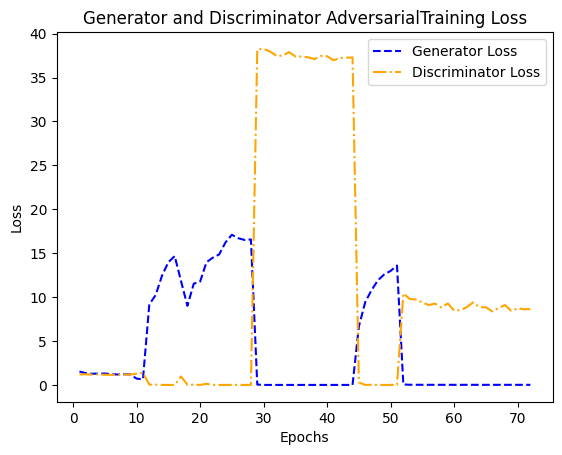

In [51]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, train_generator_gan_losses, '--b', label='Generator Loss')
plt.plot(epochs, train_discriminator_losses, '-.', color='orange', label='Discriminator Loss')
plt.title('Generator and Discriminator AdversarialTraining Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/train_loss_plot_1.png')
plt.show()

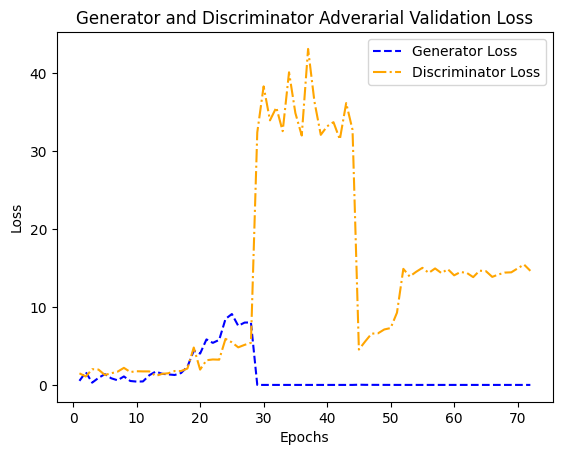

In [52]:
epochs = range(1, len(test_generator_losses) + 1)

plt.plot(epochs, test_generator_gan_losses, '--b', label='Generator Loss')
plt.plot(epochs, test_discriminator_losses, '-.', color='orange', label='Discriminator Loss')
plt.title('Generator and Discriminator Adverarial Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/test_loss_plot_1.png')
plt.show()

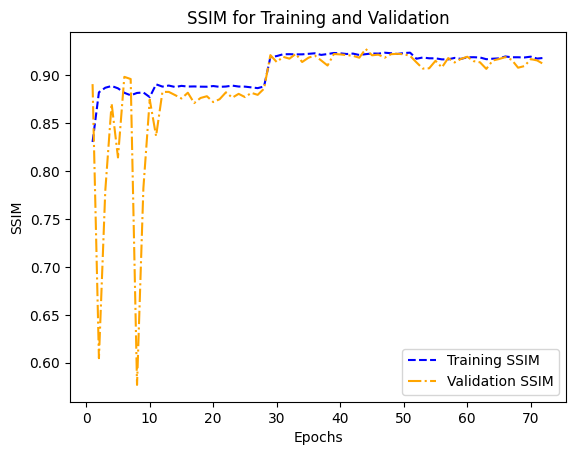

In [53]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, training_ssim, '--b', label='Training SSIM')
plt.plot(epochs, testing_ssim, '-.', color='orange', label='Validation SSIM')
plt.title('SSIM for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('SSIM')
plt.legend()
plt.savefig('/kaggle/working/SSIM_plot_1.png')
plt.show()

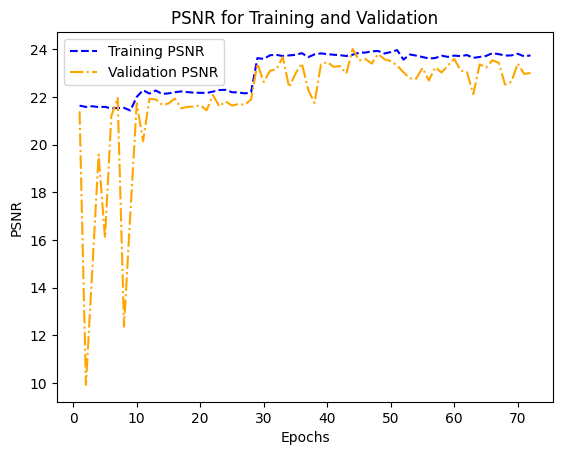

In [54]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, training_psnr, '--b', label='Training PSNR')
plt.plot(epochs, testing_psnr, '-.', color='orange', label='Validation PSNR')
plt.title('PSNR for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('PSNR')
plt.legend()
plt.savefig('/kaggle/working/PSNR_plot_1.png')
plt.show()

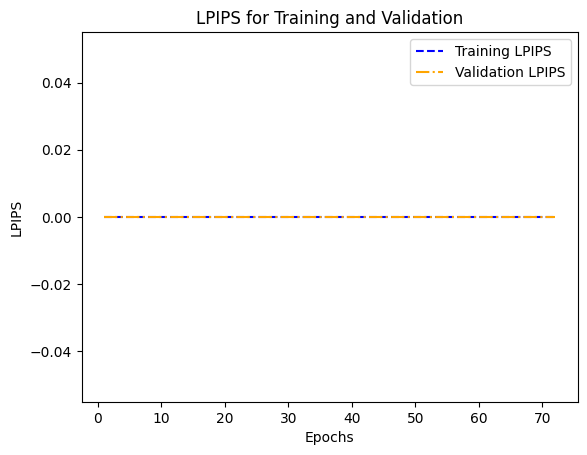

In [55]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, training_lpips, '--b', label='Training LPIPS')
plt.plot(epochs, testing_lpips, '-.', color='orange', label='Validation LPIPS')
plt.title('LPIPS for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('LPIPS')
plt.legend()
plt.savefig('/kaggle/working/LPIPS_plot_1.png')
plt.show()

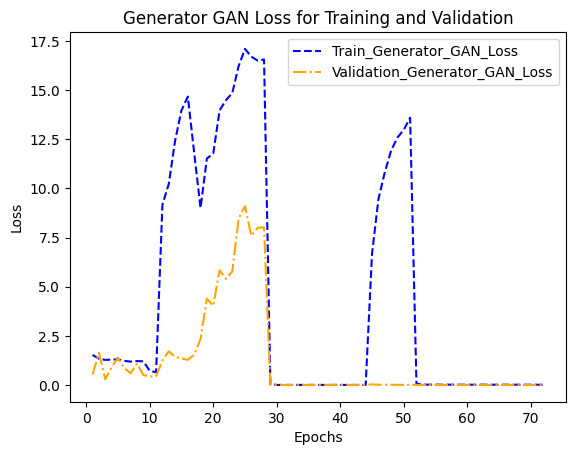

In [56]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, train_generator_gan_losses, '--b', label='Train_Generator_GAN_Loss')
plt.plot(epochs, test_generator_gan_losses,'-.', color='orange', label='Validation_Generator_GAN_Loss')
plt.title('Generator GAN Loss for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/Gen_GAN_plot_1.png')
plt.show()

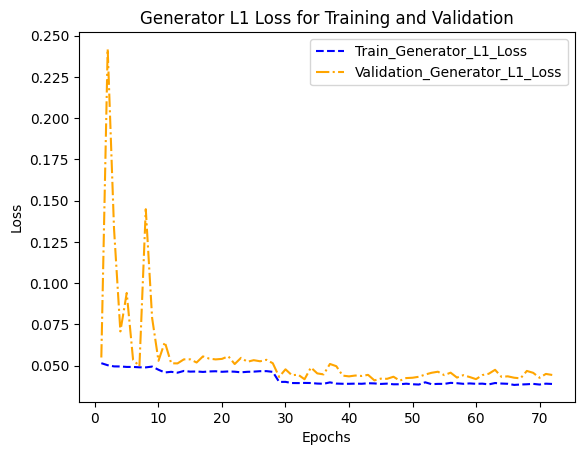

In [57]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, train_generator_l1_losses, '--b', label='Train_Generator_L1_Loss')
plt.plot(epochs, test_generator_l1_losses, '-.', color='orange', label='Validation_Generator_L1_Loss')
plt.title('Generator L1 Loss for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/Gen_L1_plot_1.png')
plt.show()

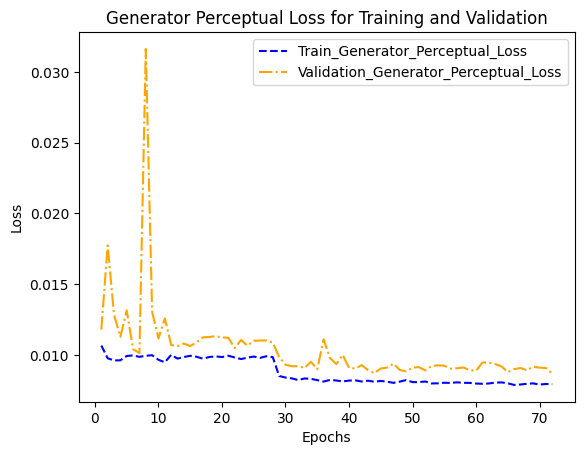

In [58]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, train_generator_perceptual_losses, '--b', label='Train_Generator_Perceptual_Loss')
plt.plot(epochs, test_generator_perceptual_losses, '-.', color='orange', label='Validation_Generator_Perceptual_Loss')
plt.title('Generator Perceptual Loss for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/Gen_Perceptual_plot_1.png')
plt.show()

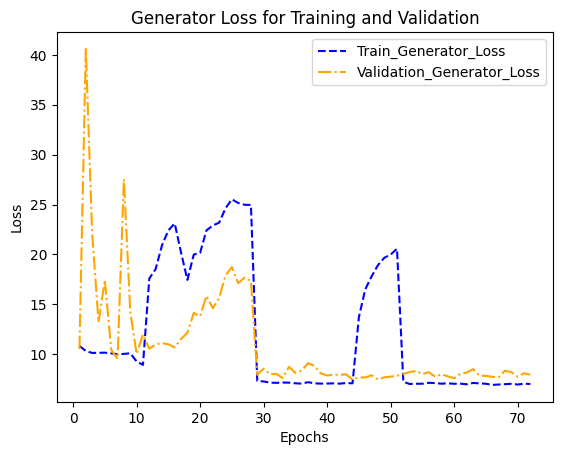

In [59]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, train_generator_losses, '--b', label='Train_Generator_Loss')
plt.plot(epochs, test_generator_losses, '-.', color='orange', label='Validation_Generator_Loss')
plt.title('Generator Loss for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/Gen_plot_1.png')
plt.show()

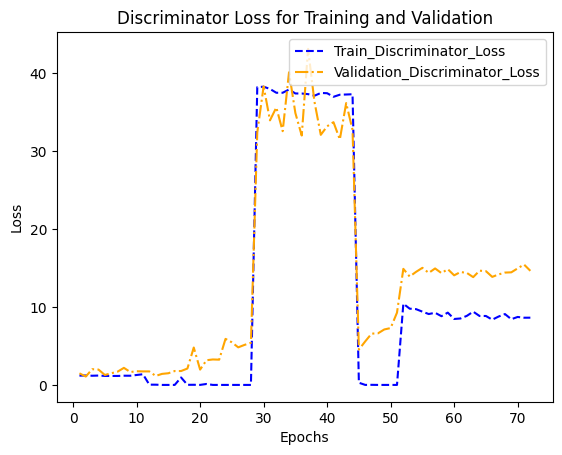

In [60]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, train_discriminator_losses, '--b', label='Train_Discriminator_Loss')
plt.plot(epochs, test_discriminator_losses, '-.', color='orange', label='Validation_Discriminator_Loss')
plt.title('Discriminator Loss for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/Disc_plot_1.png')
plt.show()

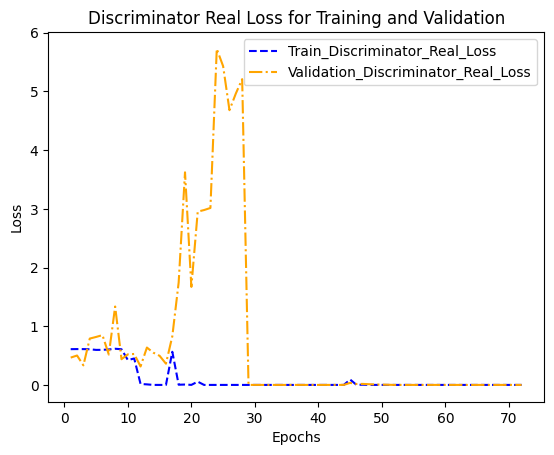

In [61]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, train_discriminator_real_losses, '--b', label='Train_Discriminator_Real_Loss')
plt.plot(epochs, test_discriminator_real_losses, '-.', color='orange', label='Validation_Discriminator_Real_Loss')
plt.title('Discriminator Real Loss for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/Disc_Real_plot_1.png')
plt.show()

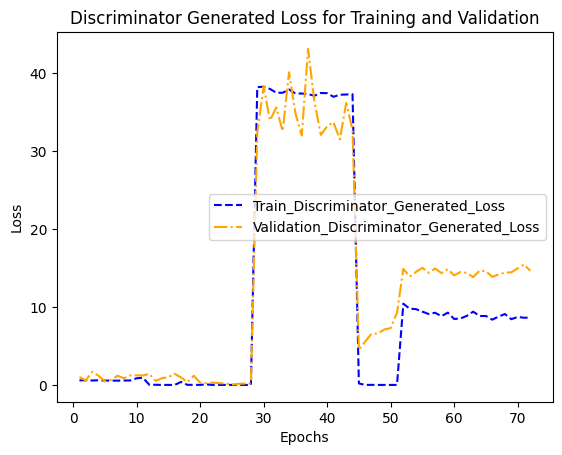

In [62]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, train_discriminator_generated_losses, '--b', label='Train_Discriminator_Generated_Loss')
plt.plot(epochs, test_discriminator_generated_losses,'-.', color='orange', label='Validation_Discriminator_Generated_Loss')
plt.title('Discriminator Generated Loss for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/Disc_Generated_plot_1.png')
plt.show()

In [63]:
import csv
with open('/kaggle/working/dataJan20.csv','w', newline='') as file:
    writer = csv.writer(file)
    writer.writerows(all_records)

In [64]:
# # Evaluation on testing data


# each_epoch_test_lpips = []
# each_epoch_test_psnr = []
# each_epoch_test_ssim = []
# each_epoch_test_fid = []
# each_epoch_test_generator_losses = []
# each_epoch_test_generator_gan_losses = []
# each_epoch_test_generator_l1_losses = []
# each_epoch_test_generator_l2_losses = []
# each_epoch_test_generator_perceptual_losses = []
# each_epoch_test_discriminator_losses = []
# each_epoch_test_discriminator_real_losses = []
# each_epoch_test_discriminator_generated_losses = []

# for n, (input_, target) in test_dataset.enumerate():
#     test_gen_loss, test_gen_gan_loss, test_gen_l1_loss, test_gen_perceptual_loss, test_disc_loss, test_disc_real_loss, test_disc_generated_loss, test_ssim, test_psnr, test_lpips, test_fid = test_step(input_, target)

#     each_epoch_test_generator_losses.append(test_gen_loss)
#     each_epoch_test_generator_gan_losses.append(test_gen_gan_loss)
#     each_epoch_test_generator_l1_losses.append(test_gen_l1_loss)
# #             each_epoch_test_generator_l2_losses.append(test_gen_l2_loss)
#     each_epoch_test_generator_perceptual_losses.append(test_gen_perceptual_loss)
#     each_epoch_test_discriminator_losses.append(test_disc_loss)
#     each_epoch_test_discriminator_real_losses.append(test_disc_real_loss)
#     each_epoch_test_discriminator_generated_losses.append(test_disc_generated_loss)
#     each_epoch_test_ssim.append(tf.reduce_mean(test_ssim.numpy()))
#     each_epoch_test_psnr.append(tf.reduce_mean(test_psnr.numpy()))
#     each_epoch_test_lpips.append(tf.reduce_mean(test_lpips.numpy()))
#     each_epoch_test_fid.append(test_fid)
#     print(test_fid)

# print("Testing Details")
# print("Generator-- total_loss:{:.5f} gan_loss:{:.5f} l1_loss:{:.5f}  perceptual_loss:{:.5f} \nDiscriminator-- total_loss:{:.5f} real_loss:{:.5f} generated_loss:{:.5f} --- \nSSIM {:.5f} \nPSNR {:.5f} \nLPIPS {:.5f} \nFID Score: {:.5f}".format(np.mean(each_epoch_test_generator_losses),np.mean(each_epoch_test_generator_gan_losses), np.mean(each_epoch_test_generator_l1_losses), np.mean(each_epoch_test_generator_perceptual_losses),np.mean(each_epoch_test_discriminator_losses), np.mean(each_epoch_test_discriminator_generated_losses), np.mean(each_epoch_test_discriminator_real_losses), np.mean(each_epoch_test_ssim), np.mean(each_epoch_test_psnr), np.mean(each_epoch_test_lpips), np.mean(each_epoch_test_fid)))

In [65]:
os.mkdir('/kaggle/working/modelsFeb7')

In [66]:
gen.save('/kaggle/working/modelsFeb7/gen.h5')
gen.save_weights('/kaggle/working/modelsFeb7/gen_weight.keras')
disc.save('/kaggle/working/modelsFeb7/disc.h5')
disc.save_weights('/kaggle/working/modelsFeb7/disc_wweight.keras')

/opt/conda/lib/python3.10/site-packages/keras/src/engine/training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [67]:
def download_file(path, download_file_name):
    os.chdir('/kaggle/working/')
    zip_name = f"/kaggle/working/{download_file_name}.zip"
    command = f"zip {zip_name} {path} -r"
    result = subprocess.run(command, shell=True, capture_output=True, text=True)
    if result.returncode !=0:
        print("Unable to run zip command")
        print(result.stderr)
        return
    display(FileLink(f'{download_file_name}.zip'))

In [68]:
import subprocess
from IPython.display import FileLink, display

In [69]:
download_file('/kaggle/working', 'outputFeb10')

/kaggle/working/outputFeb10.zip